# Generate full emissions portfolio from projected Kyoto gas baskets
Updated to include announcements as of COP26, 5/11/21. Including an analysis of full impact of Net Zero commitments on emissions.
# Part 3: extend and infill data

import sys
stdout = sys.stdout

In [1]:
import country_converter
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import pyam
import pymagicc
import re
import scmdata
from scipy.interpolate import interp1d, PchipInterpolator

<IPython.core.display.Javascript object>

In [2]:
import sys
stdout = sys.stdout

In [3]:
from silicone.time_projectors import ExtendLatestTimeQuantile
import silicone.multiple_infillers as mi
import silicone.database_crunchers as dc
from silicone.utils import convert_units_to_MtCO2_equiv, _construct_consistent_values

In [4]:
version_no = "22.7"

# Import the data

In [5]:
co2 = "Emissions|CO2"
co2ind = "Emissions|CO2|Energy and Industrial Processes"
co2afolu = "Emissions|CO2|AFOLU"
variable = "Emissions|Kyoto Gases (AR6-GWP100)"
kyexaf = variable + "|Excluding CO2 AFOLU"
unit = "Mt CO2-equiv/yr"
co2unit = "Mt CO2/yr"
regional_emtype = [co2ind, co2afolu, "Emissions|CH4", "Emissions|N2O", "Emissions|F-Gases"]

In [6]:
out_folder = f"../output/processed_files/{version_no}/"
harm_all = pyam.IamDataFrame(out_folder + f"harm_all_{version_no}.csv")
harmed_sr15  = pyam.IamDataFrame(out_folder + "sr15_cleaned_harmed.csv")
harmed_sr15_regions = pyam.IamDataFrame(out_folder + "sr15_cleaned_harmed_regions.csv")
sr15 = pyam.IamDataFrame(out_folder + "sr15_cleaned.csv")

pyam - INFO: Running in a notebook, setting up a basic logging at level INFO
pyam.core - INFO: Reading file ..\output\processed_files\22.7\harm_all_22.7.csv
pyam.core - INFO: Reading file ..\output\processed_files\22.7\sr15_cleaned_harmed.csv
pyam.core - INFO: Reading file ..\output\processed_files\22.7\sr15_cleaned_harmed_regions.csv
pyam.core - INFO: Reading file ..\output\processed_files\22.7\sr15_cleaned.csv


In [7]:
harm_all.year

[2000, 2005, 2010, 2015, 2020, 2025, 2030]

# Calculate implied carbon price
Firstly we calculate the carbon price of the pathway up to 2030. Then we extend the carbon price from 2030 in various ways. We then interpolate the Kyoto emissions from this. 

In [8]:
price = "Price|Carbon"
price_unit = "US$2010/t CO2"
orig_ssps = sr15.filter(scenario="SSP*")
harmed_sr15_regions = harmed_sr15_regions.append(orig_ssps.filter(variable=price))
harmed_sr15 = harmed_sr15.append(orig_ssps.filter(variable=price, region="World"))

In [9]:
harmed_sr15_regions.filter(variable=variable).region

['R5ASIA', 'R5LAM', 'R5MAF', 'R5OECD90+EU', 'R5REF', 'World']

In [10]:
harmed_sr15_kyexaf = harmed_sr15.filter(scenario="SSP*").subtract(variable, co2afolu, kyexaf, ignore_units=True)
harmed_sr15_regions_kyexaf = harmed_sr15_regions.subtract(
    variable, co2afolu, kyexaf, ignore_units=True)
harmed_sr15_kyexaf = harmed_sr15_kyexaf.data
harmed_sr15_kyexaf["unit"] = unit
harmed_sr15 = harmed_sr15.append(pyam.IamDataFrame(harmed_sr15_kyexaf))
harmed_sr15_regions_kyexaf = harmed_sr15_regions_kyexaf.data
harmed_sr15_regions_kyexaf["unit"] = unit
harmed_sr15_regions = harmed_sr15_regions.append(pyam.IamDataFrame(harmed_sr15_regions_kyexaf))

In [11]:
harmed_sr15.variable

['Emissions|BC',
 'Emissions|CH4',
 'Emissions|CO',
 'Emissions|CO2',
 'Emissions|CO2|AFOLU',
 'Emissions|CO2|Energy and Industrial Processes',
 'Emissions|F-Gases',
 'Emissions|HFC',
 'Emissions|HFC|HFC125',
 'Emissions|HFC|HFC134a',
 'Emissions|HFC|HFC143a',
 'Emissions|HFC|HFC227ea',
 'Emissions|HFC|HFC23',
 'Emissions|HFC|HFC245fa',
 'Emissions|HFC|HFC32',
 'Emissions|HFC|HFC43-10',
 'Emissions|Kyoto Gases (AR6-GWP100)',
 'Emissions|Kyoto Gases (AR6-GWP100)|Excluding CO2 AFOLU',
 'Emissions|N2O',
 'Emissions|NH3',
 'Emissions|NOx',
 'Emissions|OC',
 'Emissions|PFC',
 'Emissions|PFC|C2F6',
 'Emissions|PFC|CF4',
 'Emissions|SF6',
 'Emissions|Sulfur',
 'Emissions|VOC',
 'Price|Carbon']

In [12]:
simplest_infill_data = harm_all.filter(region="World", year=[2010, 2015, 2020, 2030])
simplest_infill_data.timeseries().head()

2010  \
model                  scenario                   region variable                           unit                            
Current policies       Max|Harmonized             World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  50209.503493   
                       Median|Harmonized          World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  50209.503493   
                       Min|Harmonized             World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  50209.503493   
NDC case - conditional 10th percentile|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  50209.503493   
                       90th percentile|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  50209.503493   

                                                                                                                     2015  \
model                  scenario                   region variable                           unit                            
Current policies       Max|Harmonized             World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54198.069883   
                       Median|Harmonized          World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54198.069883   
                       Min|Harmonized             World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54198.069883   
NDC case - conditional 10th percentile|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54198.069883   
                       90th percentile|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54198.069883   

                                                                                                                     2020  \
model                  scenario                   region variable                           unit                            
Current policies       Max|Harmonized             World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55405.021054   
                       Median|Harmonized          World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54963.616894   
                       Min|Harmonized             World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53490.424947   
NDC case - conditional 10th percentile|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53476.651622   
                       90th percentile|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55042.375044   

                                                                                                                     2030  
model                  scenario                   region variable                           unit                           
Current policies       Max|Harmonized             World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  59722.144146  
                       Median|Harmonized          World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  57954.446745  
                       Min|Harmonized             World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  52054.734390  
NDC case - conditional 10th percentile|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  49172.177290  
                       90th percentile|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54880.135250

In [13]:
harmed_sr15.filter(model="WITCH-GLOBIOM 3.*").model

['WITCH-GLOBIOM 3.1']

In [14]:
mod_scen_list = [
    #("MESSAGE-GLOBIOM 1.0", "SSP2*"), 
    #("MESSAGE-GLOBIOM 1.0", "SSP1*"), 
    ("WITCH-GLOBIOM 3.1", "SSP2*"),
    #("IMAGE*", "SSP2*"), 
    #("IMAGE*", "SSP5*"), 
    #("AIM/CGE 2.0", "SSP1*"),
    ("AIM/CGE 2.0", "SSP2*"),
    #("GCAM 4.2", "SSP1*"),
    #("REMIND-MAgPIE 1.5*", "SSP1*"),
    ("REMIND-MAgPIE 1.5*", "SSP2*"),
    #("REMIND-MAgPIE 1.5*", "SSP5*"),
    ("GCAM 4.2", "SSP2*"), 
]
hfcs = [
    "Emissions|HFC|HFC125", "Emissions|HFC|HFC134a", "Emissions|HFC|HFC143a",
    "Emissions|HFC|HFC227ea", "Emissions|HFC|HFC23", "Emissions|HFC|HFC32", "Emissions|HFC|HFC43-10",
]
fgases = ["Emissions|HFC", "Emissions|SF6", 'Emissions|PFC|C2F6', 'Emissions|PFC|CF4']
fgas = "Emissions|F-Gases"
years = [2015] + list(range(2010, 2101, 10))

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


WITCH-GLOBIOM 3.1_SSP2*  \
model                    scenario                                              
Current policies         Max|Harmonized                            18.219098   
                         Median|Harmonized                         22.355406   
                         Min|Harmonized                            40.564877   
NDC case - conditional   10th percentile|Harmonized                52.764467   
                         90th percentile|Harmonized                30.960795   
                         Median|Harmonized                         37.856696   
NDC case - unconditional 10th percentile|Harmonized                38.227121   
                         90th percentile|Harmonized                23.383130   
                         Median|Harmonized                         28.106086   

                                                     AIM/CGE 2.0_SSP2*  \
model                    scenario                                        
Current policies         Max|Harmonized                       5.690216   
                         Median|Harmonized                    7.720658   
                         Min|Harmonized                      22.852411   
NDC case - conditional   10th percentile|Harmonized          33.951366   
                         90th percentile|Harmonized          14.114415   
                         Median|Harmonized                   20.328743   
NDC case - unconditional 10th percentile|Harmonized          20.673115   
                         90th percentile|Harmonized           8.353286   
                         Median|Harmonized                   11.767847   

                                                     REMIND-MAgPIE 1.5*_SSP2*  \
model                    scenario                                               
Current policies         Max|Harmonized                              9.701791   
                         Median|Harmonized                          13.243233   
                         Min|Harmonized                             28.935874   
NDC case - conditional   10th percentile|Harmonized                 40.065678   
                         90th percentile|Harmonized                 21.123112   
                         Median|Harmonized                          26.871746   
NDC case - unconditional 10th percentile|Harmonized                 27.153131   
                         90th percentile|Harmonized                 14.154945   
                         Median|Harmonized                          18.462341   

                                                     GCAM 4.2_SSP2*  
model                    scenario                                    
Current policies         Max|Harmonized                    8.267319  
                         Median|Harmonized                14.385268  
                         Min|Harmonized                   46.990328  
NDC case - conditional   10th percentile|Harmonized       69.564937  
                         90th percentile|Harmonized       29.035577  
                         Median|Harmonized                41.860964  
NDC case - unconditional 10th percentile|Harmonized       42.561787  
                         90th percentile|Harmonized       16.029796  
                         Median|Harmonized                23.985570

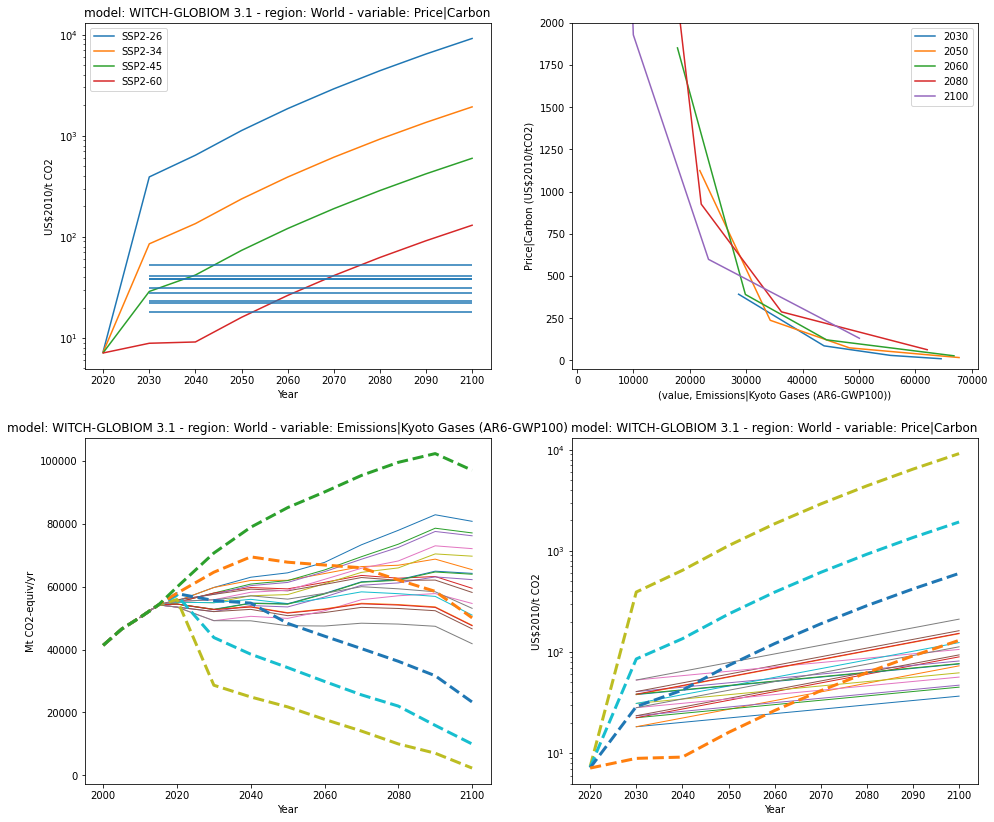

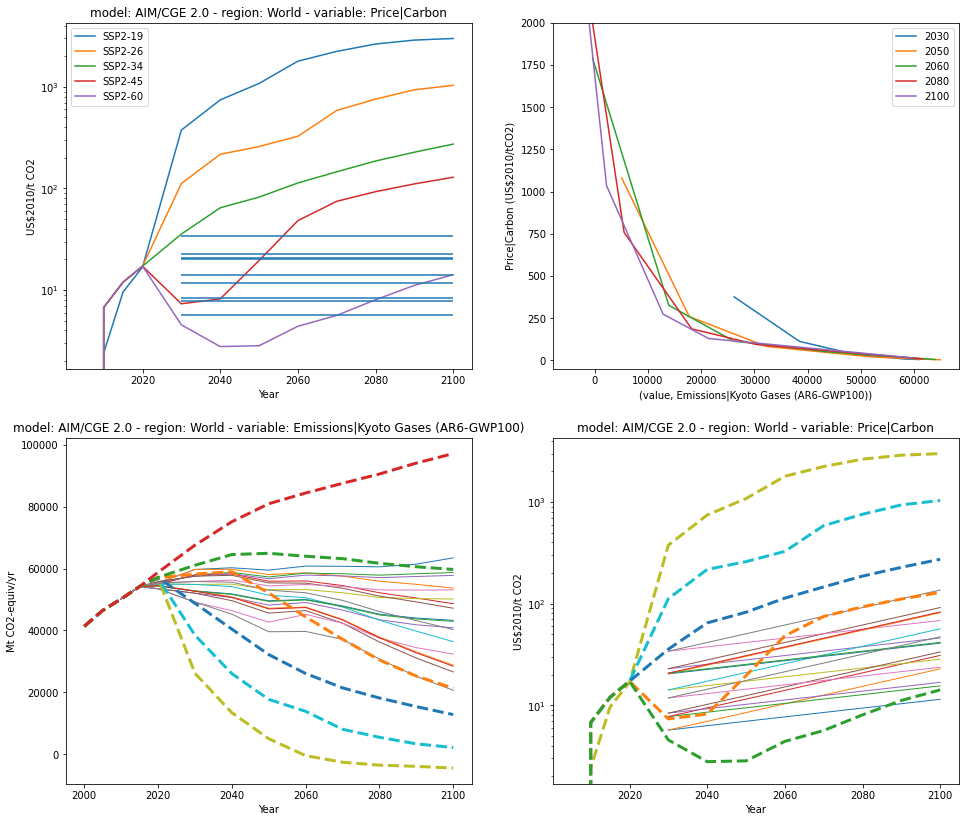

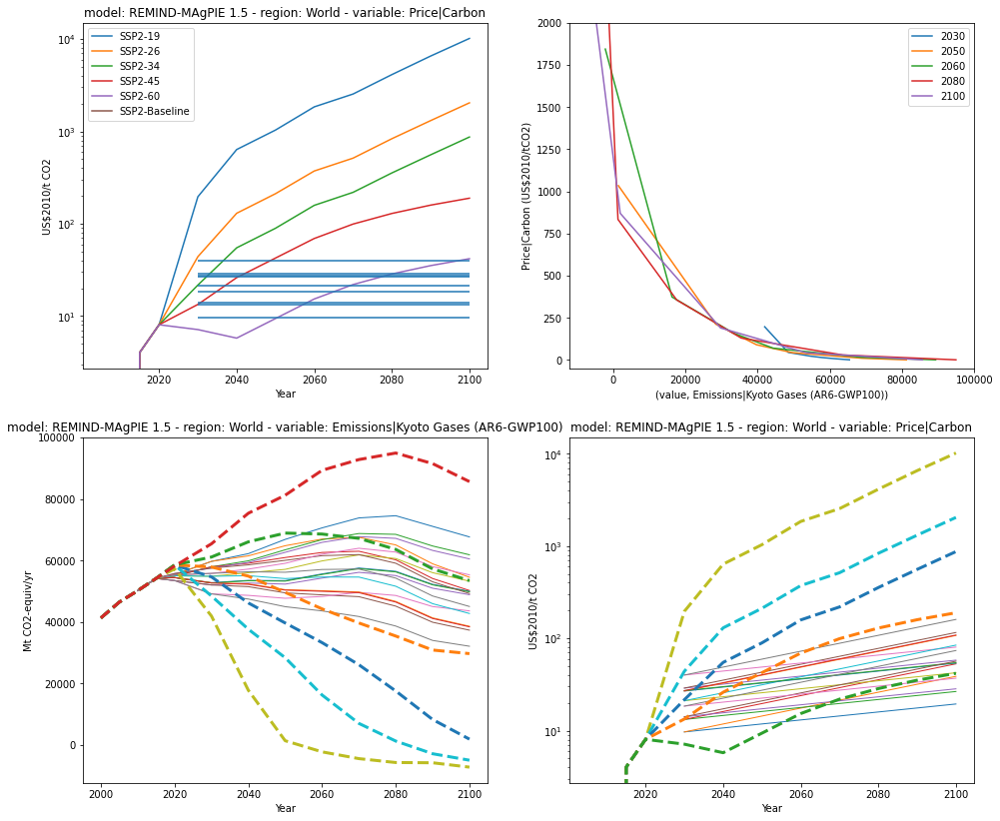

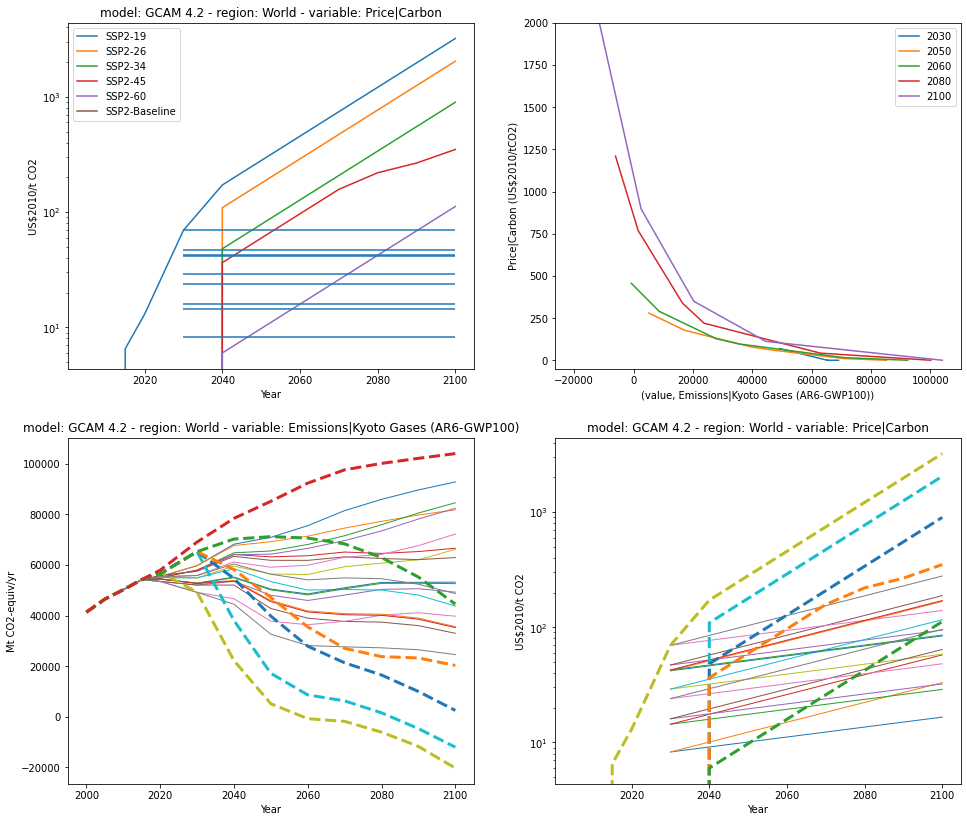

In [15]:
# Calculate initial carbon price trajectory. Then assume the carbon price increases by some 
# amount each year
increase_rates = [0, 1, 2, 3, 4, 5]
price_kyoto_var = variable
kindinterp = "PchipInterpolator"
if price_kyoto_var == kyexaf:
    price_scenario_str = "|KyotoExAfFromPrice_incrate"
else:
    price_scenario_str = "|KyotoFromPrice_incrate"
if kindinterp == "PchipInterpolator":
    def interpfunction(**args):
        order = np.argsort(args["x"])
        def pchipWithLimits(interpx):
            interpx2 = interpx.copy()
            interpx2[interpx > max(args["x"])] = max(args["x"])
            interpx2[interpx < min(args["x"])] = min(args["x"])
            return PchipInterpolator(args["x"][order], args["y"][order], extrapolate=False)(interpx2)
        return pchipWithLimits
else:
    def interpfunction(**args):
        return interp1d(**args)
unep2030 = simplest_infill_data.filter(year=2030, variable=price_kyoto_var).data.pivot(
    index=["model", "scenario"], columns="variable"
)
# set up plots
all_carbon_prices = pd.DataFrame(index=unep2030.index, dtype="float64")
# Ensure that the final placement is clear (this allows the cell to be rerunable)
try:
    del all_kyoto_prices 
except NameError:
    pass
for (model, scenario) in mod_scen_list:
    plt.figure(figsize=(16, 14))
    i = 1
    # Calculate the implied price in 2030
    label = model + "_" + scenario
    price2030 = harmed_sr15.filter(
        variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2030).data[[
        "scenario", "variable", "value"
    ]].pivot(
        index=["scenario"], columns="variable"
    ).fillna(0)
    implied_price = interpfunction(
        x=price2030[("value", price_kyoto_var)],  y=price2030[("value", price)], 
        bounds_error=False,
        fill_value=(max(price2030[("value", price)]), min(price2030[("value", price)])),
        kind=kindinterp
    )(unep2030["value"])
    all_carbon_prices[label] = implied_price
    price_infiller = dc.Interpolation(
        harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario)
    ).derive_relationship(price, [price_kyoto_var], interpkind=kindinterp)
    for increase_rate in increase_rates:
        # Get a copy of the trend so far
        price_kyoto_to_date = simplest_infill_data.filter(variable=price_kyoto_var).data.copy()
        price_kyoto_to_date["scenario"] =  price_kyoto_to_date["scenario"] + \
        price_scenario_str + str(increase_rate) + "_" + model + "_" + scenario[:-1]
        try:
            all_kyoto_prices = all_kyoto_prices.append(price_kyoto_to_date)
        except NameError:
            all_kyoto_prices = price_kyoto_to_date
        
        # insert prices for the years so far (after 2030 because values are silly before that)
        price_to_date = pyam.IamDataFrame(price_kyoto_to_date).filter(year=[2030]).data
        price_to_date["variable"] = price
        year = 2030
        priceyear = harmed_sr15.filter(
            variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year
        ).data[["scenario", "variable", "value"]].pivot(index=["scenario"], columns="variable").fillna(0)
        locs = price_to_date.year == year
        price_to_date.loc[locs, "value"] = interpfunction(
            x=priceyear[("value", price_kyoto_var)], y=priceyear[("value", price)], 
            fill_value=(max(priceyear[("value", price)]), min(priceyear[("value", price)])),
            bounds_error=False, kind=kindinterp
        )(price_to_date.loc[locs, "value"])
        price_to_date.loc[locs, "unit"] = price_unit
        
        all_kyoto_prices = all_kyoto_prices.append(price_to_date)

        for year in list(range(2040, 2101, 10)):
            price_kyoto = simplest_infill_data.filter(year=2030, variable=price_kyoto_var).data.copy()
            price_kyoto["year"] = year
            price_kyoto["scenario"] =  price_kyoto["scenario"] + price_scenario_str + str(increase_rate) \
                + "_" + model + "_" + scenario[:-1]
            price_df = price_kyoto.copy()
            price_df["variable"] = price
            price_df["unit"] = price_unit
            priceyear = harmed_sr15.filter(
                variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year
            ).data[["scenario", "variable", "value"]].pivot(
                index=["scenario"], columns="variable"
            ).fillna(0)
            price_df["value"] = (all_carbon_prices[label] * (1+increase_rate/100) ** (year-2030)).tolist()
            price_kyoto["value"] = interpfunction(
                x=priceyear[("value", price)],
                y=priceyear[("value", price_kyoto_var)], kind=kindinterp,
                fill_value = (max(priceyear[("value", price_kyoto_var)]), 
                              min(priceyear[("value", price_kyoto_var)]))
            )(price_df["value"])
            all_kyoto_prices = all_kyoto_prices.append(price_kyoto).append(price_df)
    ax=plt.subplot(2, 2, i)
    harmed_sr15.filter(variable=price, model=model, scenario=scenario).plot(ax=ax)
    plt.hlines(implied_price, xmin=2030, xmax=2100)
    plt.yscale("log")
    ax = plt.subplot(2, 2, i+1)
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2030).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2030")
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2050).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2050")
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2060).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2060")
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2080).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2080")
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2100).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2100")
    ax.set_ylim([-50, 2000])
    ax.set_ylabel(price + " (US\$2010/tCO2)")
    ax = plt.subplot(2, 2, i+2)
    pyam.IamDataFrame(all_kyoto_prices).filter(scenario = "*" + label, variable=price_kyoto_var).plot(
        ax=ax, linewidth=1)
    harmed_sr15.filter(variable=price_kyoto_var, model=model, scenario=scenario).plot(
        ax=ax, linewidth=3, linestyle="--")
    ax = plt.subplot(2, 2, i+3)
    pyam.IamDataFrame(all_kyoto_prices).filter(scenario = "*" + label, variable=price).plot(
        ax=ax, linewidth=1)
    harmed_sr15.filter(variable=price, model=model, scenario=scenario).plot(
        ax=ax, linewidth=3, linestyle="--")
    plt.yscale("log")
    i += 3
all_carbon_prices

In [16]:
max(price2030[("value", price_kyoto_var)])

69047.57633442622

In [17]:
max(unep2030[("value", price_kyoto_var)])

59722.144145726095

In [18]:
min(price2030[("value", price_kyoto_var)])

49192.479618995385

In [19]:
min(unep2030[("value", price_kyoto_var)])

49172.17729006476

In [20]:
# infilling from price is bad if we don't meet this condition. 
if ((max(price2030[("value", price_kyoto_var)]) >= max(unep2030[("value", price_kyoto_var)]) ) or 
    (min(price2030[("value", price_kyoto_var)]) <= min(unep2030[("value", price_kyoto_var)]))
):
      print("WARNING: emissions not always in expected range")

In [21]:
min(price2030[("value", price_kyoto_var)])

49192.479618995385

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Price|Carbon'}, xlabel='Year', ylabel='US$2010/t CO2'>

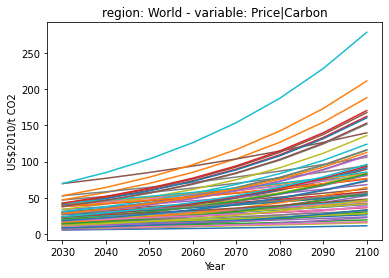

In [22]:
pyam.IamDataFrame(all_kyoto_prices).filter(variable=price).plot()

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

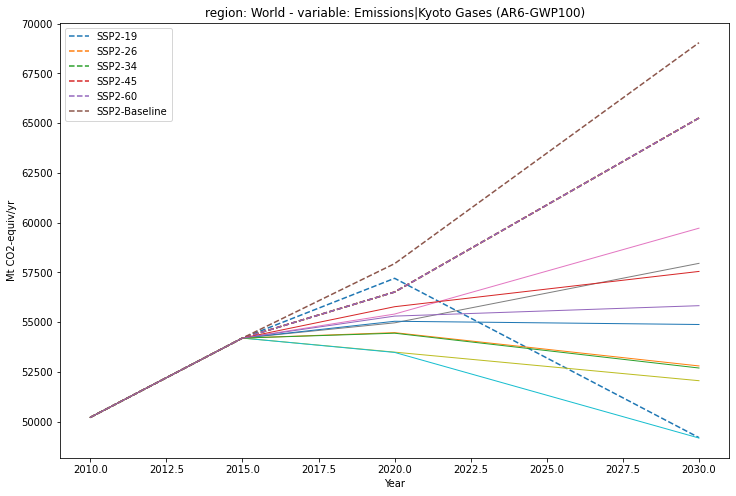

In [23]:
plt.figure(figsize=(12,8))
ax=plt.subplot()
harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price_kyoto_var, year=[2010, 2015, 2020, 2025, 2030]).plot(
    ax=ax, linestyle="--")
simplest_infill_data.filter(variable=price_kyoto_var).plot(ax=ax, linewidth=1)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


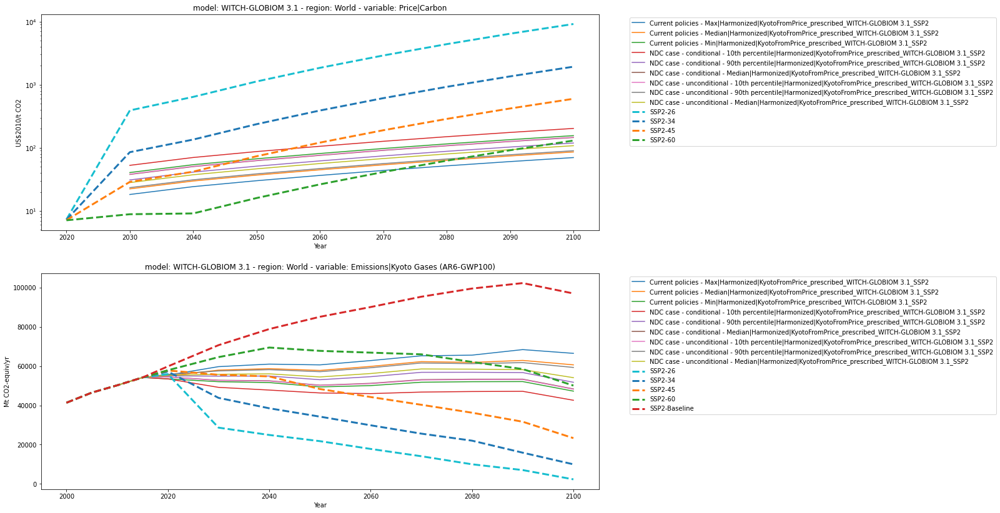

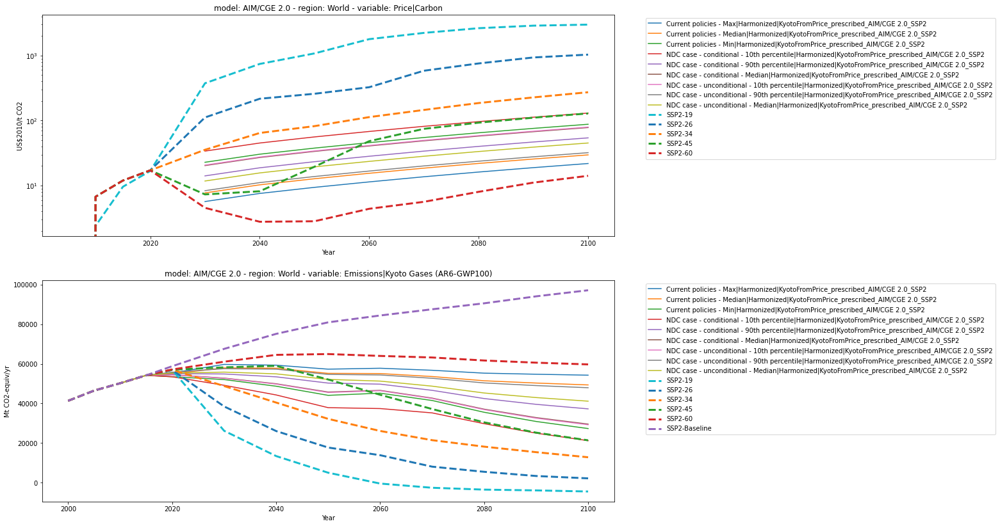

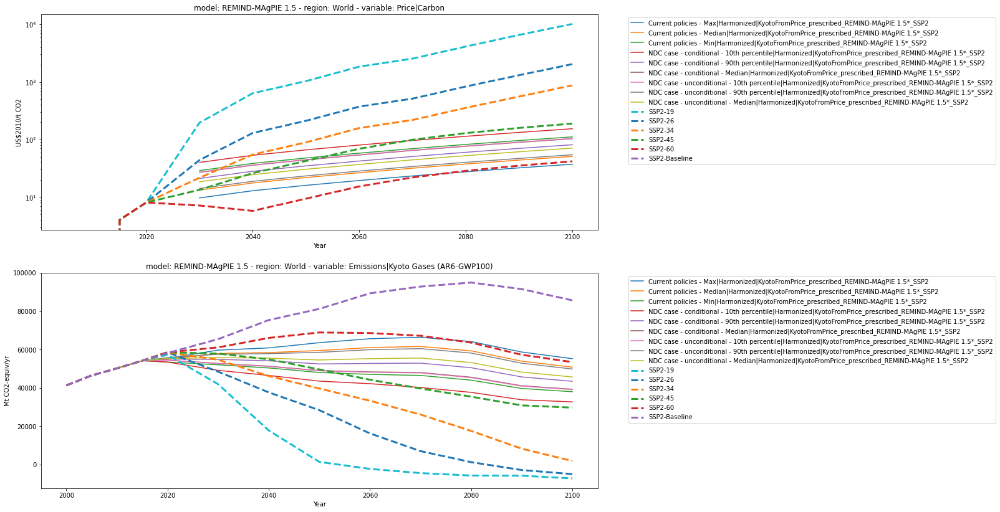

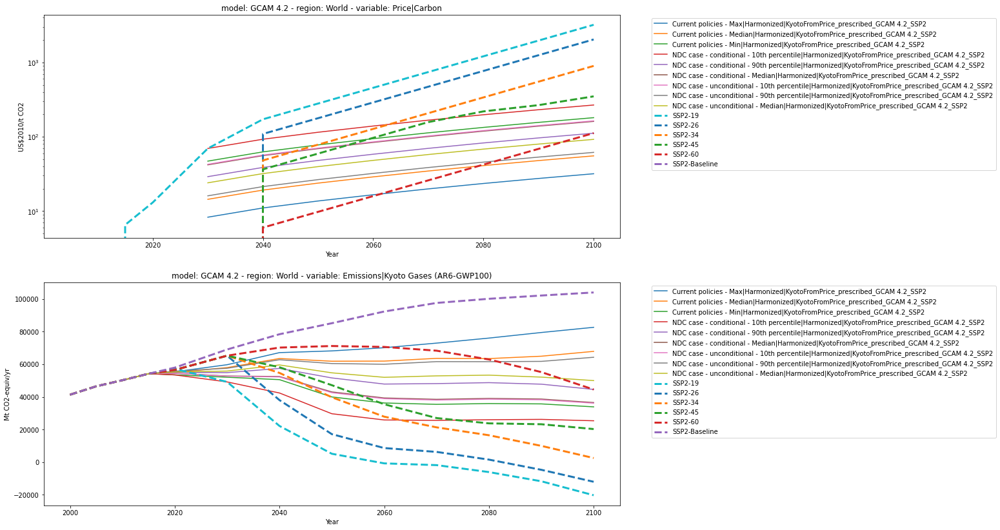

In [24]:
# We also investigate the effect of adding in a prescribed rate of 
# growth which mimics the growth of GDP in MESSAGE-GLOBIOM SSP2
prescribed_price_path = pd.read_excel(
    "../input/Carbon_price_prescribed_CAGR.xlsx", header=2, index_col=0
)
prescribed_price_path = prescribed_price_path.transpose()
prescribed_kyoto_prices = []

for (model, scenario) in mod_scen_list:
    label = model + "_" + scenario
    price_kyoto_to_date = simplest_infill_data.filter(variable=price_kyoto_var).data.copy()
    if price_kyoto_var == kyexaf:
        presc_str = "|KyotoExAfFromPrice_prescribed" + "_" + model + "_" + scenario[:-1]
    else:
        presc_str = "|KyotoFromPrice_prescribed" + "_" + model + "_" + scenario[:-1]
    price_kyoto_to_date["scenario"] =  price_kyoto_to_date["scenario"] + presc_str
    # We still need the historic data
    price_to_date = price_kyoto_to_date.copy()
    price_to_date["variable"] = price
    for year in price_to_date.year.unique():
        if year >= 2030:
            priceyear = harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year).data[[
                "scenario", "variable", "value"
            ]].pivot(
                index=["scenario"], columns="variable"
            ).fillna(0)
            locs = price_to_date.year == year
            price_to_date.loc[locs, "value"] = interpfunction(
                x=priceyear[("value", price_kyoto_var)], y=priceyear[("value", price)], 
                fill_value = (max(priceyear[("value", price)]), min(priceyear[("value", price)])), 
                bounds_error=False, kind=kindinterp
            )(price_to_date.loc[locs, "value"])
            price_to_date.loc[locs, "unit"] = price_unit
        else:
            price_to_date = price_to_date[price_to_date.year != year]
    prescribed_kyoto_prices.append(pyam.IamDataFrame(price_to_date))
    prescribed_kyoto_prices.append(pyam.IamDataFrame(price_kyoto_to_date))

    # Then add the future info
    for year in list(range(2040, 2101, 10)):
        price_kyoto = simplest_infill_data.filter(year=2030, variable=price_kyoto_var).data.copy()
        price_kyoto["year"] = year
        price_kyoto["scenario"] =  price_kyoto["scenario"] + presc_str
        priceyear = harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year).data[[
            "scenario", "variable", "value"
        ]].pivot(
            index=["scenario"], columns="variable"
        ).fillna(0)
        price_df = price_kyoto.copy()
        price_df["variable"] = price
        price_df["unit"] = price_unit
        inflation = (1+prescribed_price_path[prescribed_price_path.index <= year]).product()[0]
        price_df["value"] = (all_carbon_prices[label] * inflation).tolist()
        price_kyoto["value"] = interpfunction(
            x=priceyear[("value", price)],
            y=priceyear[("value", price_kyoto_var)],
            fill_value = (max(priceyear[("value", price_kyoto_var)]), min(priceyear[("value", price_kyoto_var)])),
            kind=kindinterp
        )(price_df["value"])
        prescribed_kyoto_prices.append(pyam.IamDataFrame(price_kyoto))
        prescribed_kyoto_prices.append(pyam.IamDataFrame(price_df))
    plt.figure(figsize=(16,14))
    ax = plt.subplot(2, 1, 1)
    pyam.concat(prescribed_kyoto_prices).filter(scenario="*" + presc_str, variable=price).plot(ax=ax)
    harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price).plot(ax=ax, linestyle="--", linewidth=3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.yscale("log")
    ax = plt.subplot(2, 1, 2)
    pyam.concat(prescribed_kyoto_prices).filter(scenario="*" + presc_str, variable=price_kyoto_var).plot(ax=ax)
    harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price_kyoto_var).plot(
        ax=ax, linestyle="--", linewidth=3
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")

In [25]:
all_kyoto_prices = pyam.IamDataFrame(all_kyoto_prices).filter(scenario="*prescribed*", keep=False).append(
    pyam.concat(prescribed_kyoto_prices)
)

In [26]:
all_kyoto_prices = pyam.IamDataFrame(all_kyoto_prices.data.copy())

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

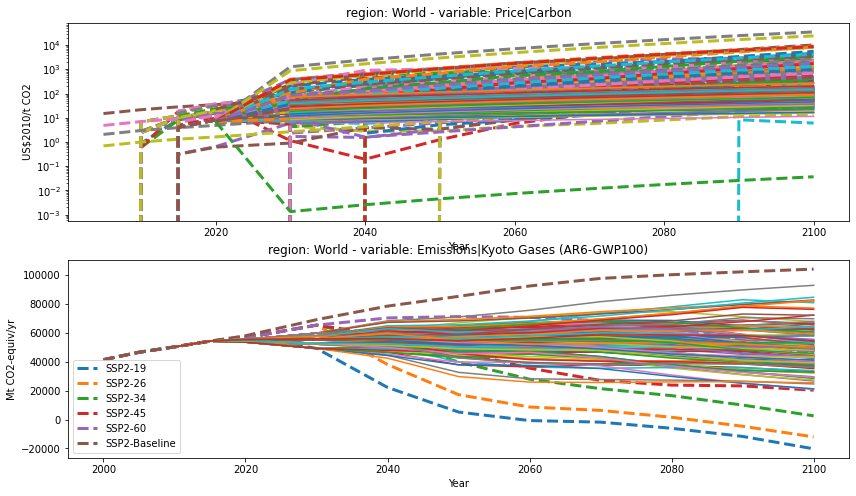

In [27]:
# Sanity check all the prices
# Sanity check the prices/Kyoto totals
plt.figure(figsize=(14, 8))
ax=plt.subplot(2,1,1)
harmed_sr15.filter(variable=[price]).plot(ax=ax, linewidth=3, linestyle="--")
all_kyoto_prices.filter(variable=price).plot(ax=ax)
plt.yscale("log")
ax=plt.subplot(2,1,2)
harmed_sr15.filter(variable=price_kyoto_var, model=model, scenario=scenario).plot(ax=ax, linewidth=3, linestyle="--")
all_kyoto_prices.filter(variable=price_kyoto_var).plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

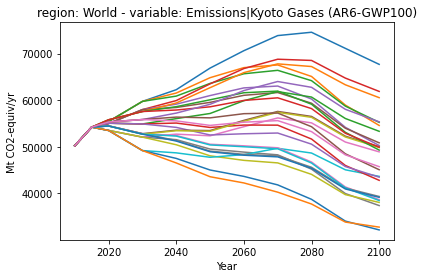

In [28]:
all_kyoto_prices.filter(variable=price_kyoto_var, scenario="*AgPIE 1.5*_SSP2").plot()

# Project Kyoto totals to 2100 directly and infill all values from this

In [29]:
# Define the function to perform the split and infill
def infill_components_of_partial_aggregate(
    price_kyoto_var, extend_df, infill_df, non_co2_ind_compon, co2, co2ind, co2afolu, 
    fgas_em_inf, years, fgas, fgases, hfcs
):
    # Infill component amounts
    split_fn = mi.SplitCollectionWithRemainderEmissions(infill_df)
    split_df = split_fn.infill_components(
        price_kyoto_var, non_co2_ind_compon, co2ind, extend_df, metric_name="AR6GWP100"
    )
    # Correct the units of the CO2ind
    split_df = split_df.data
    co2inde = [co2ind == y for y in split_df["variable"]]
    co2index = split_df[co2inde].index
    split_df.loc[co2index, "unit"] = split_df.loc[co2index, "unit"].str.replace("-equiv", "")

    extend_df = extend_df.append(pyam.IamDataFrame(split_df))

    # Infill the individual F-gases separately as they are not in these scenarios   
    fgas_em = fgas_em_inf.infill_components(
        fgas, fgases, to_infill_df=extend_df.filter(variable=fgas),
        metric_name="AR6GWP100", only_consistent_cases=True
    )
    hfc_ems = fgas_em_inf.infill_components(
        "Emissions|HFC", hfcs, to_infill_df=convert_units_to_MtCO2_equiv(
            fgas_em.filter(variable=["Emissions|HFC"]), metric_name="AR6GWP100"
        )
    )
    extend_df = pyam.concat([extend_df, fgas_em, hfc_ems])
    
    # Include all the other emissions
    infill_results = mi.infill_all_required_variables(extend_df, infill_df, [price_kyoto_var], output_timesteps=years)

    # Append CO2 total
    infill_results = infill_results.append(infill_results.aggregate(co2, components=[co2ind, co2afolu]))
    return infill_results

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


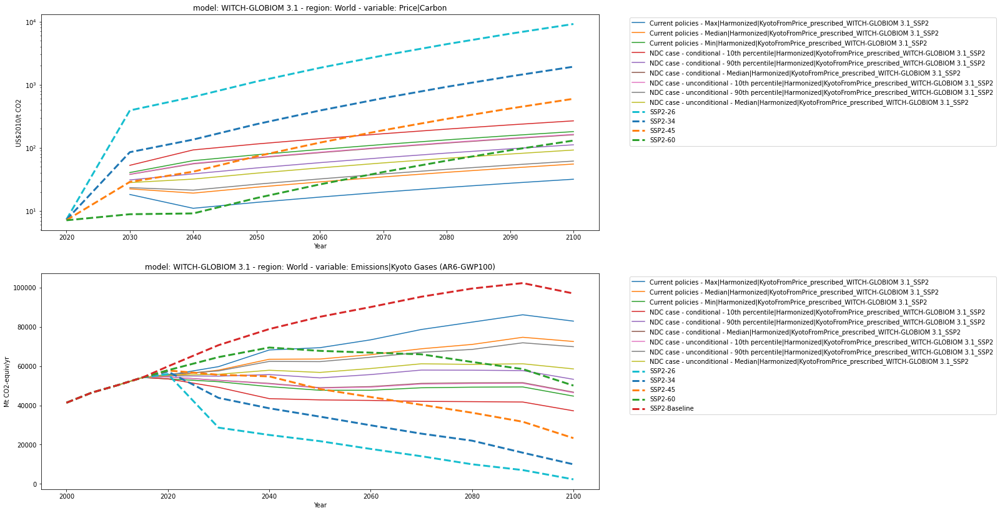

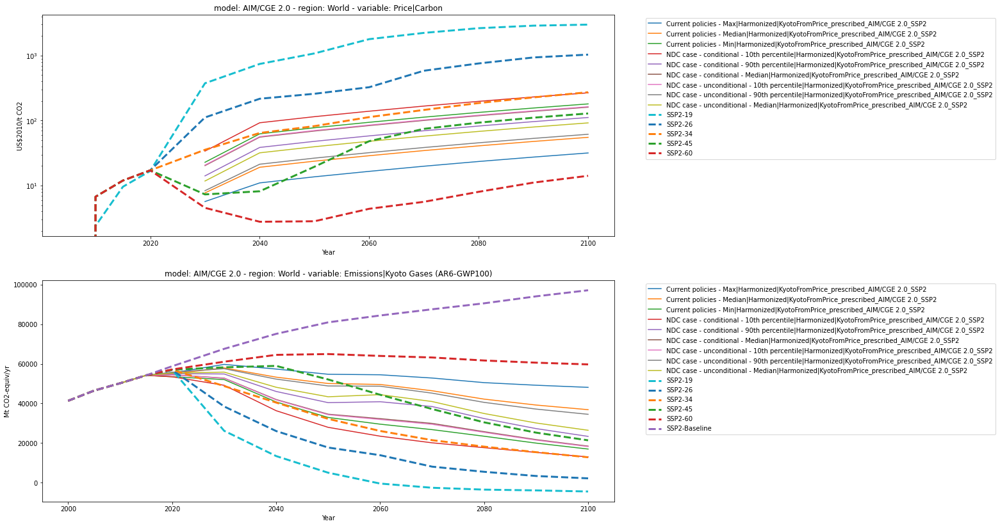

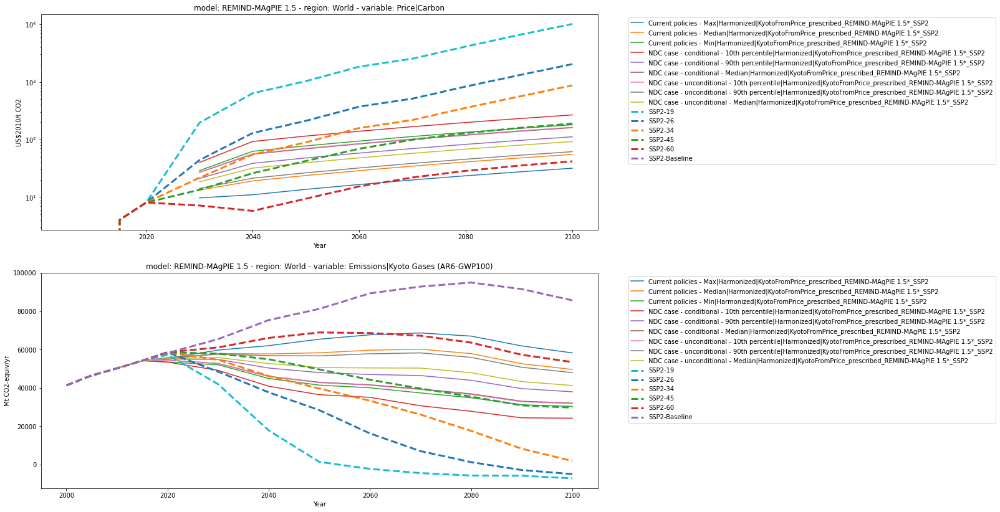

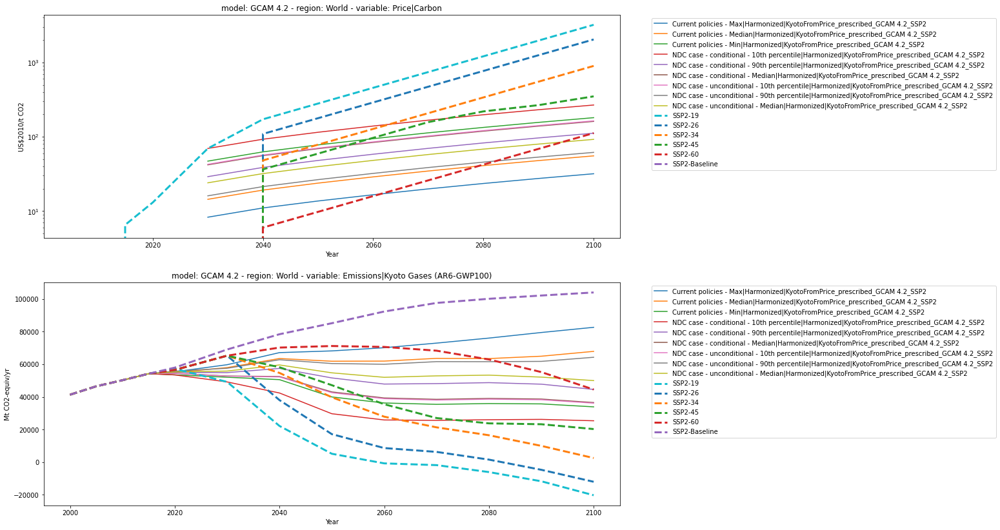

In [30]:
# We also investigate the effect of adding in a prescribed rate of 
# growth which mimics the growth in MESSAGE-GLOBIOM SSP2
prescribed_price_path = pd.read_excel(
    "../input/Carbon_price_prescribed_CAGR.xlsx", header=2, index_col=0
)
prescribed_price_path = prescribed_price_path.transpose()
all_prescribed = []
for (model, scenario) in mod_scen_list:
    price_kyoto_to_date = simplest_infill_data.filter(variable=price_kyoto_var).data.copy()
    if price_kyoto_var == kyexaf:
        presc_str = "|KyotoExAfFromPrice_prescribed" + "_" + model + "_" + scenario[:-1]
    else:
        presc_str = "|KyotoFromPrice_prescribed" + "_" + model + "_" + scenario[:-1]
    price_kyoto_to_date["scenario"] =  price_kyoto_to_date["scenario"] + presc_str
    prescribed_kyoto_prices = price_kyoto_to_date

    # We still need the historic data
    price_to_date = price_kyoto_to_date.copy()
    price_to_date["variable"] = price
    for year in price_to_date.year.unique():
        if year >= 2030:
            priceyear = harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year).data[[
                "scenario", "variable", "value"
            ]].pivot(
                index=["scenario"], columns="variable"
            ).fillna(0)
            locs = price_to_date.year == year
            price_to_date.loc[locs, "value"] = interpfunction(
                x=priceyear[("value", price_kyoto_var)], y=priceyear[("value", price)], 
                fill_value = (max(priceyear[("value", price)]), min(priceyear[("value", price)])), 
                bounds_error=False, kind=kindinterp
            )(price_to_date.loc[locs, "value"])
            price_to_date.loc[locs, "unit"] = price_unit
        else:
            price_to_date = price_to_date[price_to_date.year != year]
    prescribed_kyoto_prices = prescribed_kyoto_prices.append(price_to_date)

    # Then add the future info
    for year in list(range(2040, 2101, 10)):
        price_kyoto = simplest_infill_data.filter(year=2030, variable=price_kyoto_var).data.copy()
        price_kyoto["year"] = year
        price_kyoto["scenario"] =  price_kyoto["scenario"] + presc_str
        priceyear = harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year).data[[
            "scenario", "variable", "value"
        ]].pivot(
            index=["scenario"], columns="variable"
        ).fillna(0)
        price_df = price_kyoto.copy()
        price_df["variable"] = price
        price_df["unit"] = price_unit
        inflation = (1+prescribed_price_path[prescribed_price_path.index <= year]).product()[0]
        price_df["value"] = (all_carbon_prices[label] * inflation).tolist()
        price_kyoto["value"] = interpfunction(
            x=priceyear[("value", price)],
            y=priceyear[("value", price_kyoto_var)],
            fill_value = (max(priceyear[("value", price_kyoto_var)]), min(priceyear[("value", price_kyoto_var)])),
            kind=kindinterp
        )(price_df["value"])
        prescribed_kyoto_prices = prescribed_kyoto_prices.append(price_kyoto).append(price_df)
    plt.figure(figsize=(16,14))
    ax = plt.subplot(2, 1, 1)
    pyam.IamDataFrame(prescribed_kyoto_prices).filter(scenario="*" + presc_str, variable=price).plot(ax=ax)
    harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price).plot(ax=ax, linestyle="--", linewidth=3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.yscale("log")
    ax = plt.subplot(2, 1, 2)
    pyam.IamDataFrame(prescribed_kyoto_prices).filter(scenario="*" + presc_str, variable=price_kyoto_var).plot(ax=ax)
    harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price_kyoto_var).plot(
        ax=ax, linestyle="--", linewidth=3
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    all_prescribed.append(prescribed_kyoto_prices)

Running model WITCH-GLOBIOM 3.1, scenario SSP2*


pyam.plotting - INFO: >=13 labels, not applying legend
c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125', 'Emissions|SF6'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables: 100%|██████████████████████████████████████████████████████| 11/11 [00:01<00:00,  7.27it/s]


Running model AIM/CGE 2.0, scenario SSP2*


pyam.plotting - INFO: >=13 labels, not applying legend
c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125', 'Emissions|SF6'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables: 100%|██████████████████████████████████████████████████████| 11/11 [00:01<00:00,  6.62it/s]


Running model REMIND-MAgPIE 1.5*, scenario SSP2*


pyam.plotting - INFO: >=13 labels, not applying legend
c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125', 'Emissions|SF6'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables:  67%|████████████████████████████████████▋                  | 8/12 [00:00<00:00, 37.00it/s]silicone.database_crunchers.constant_ratio - WARNING: Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


Filling required variables: 100%|██████████████████████████████████████████████████████| 12/12 [00:00<00:00, 31.66it/s]


Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


Filling required variables: 100%|██████████████████████████████████████████████████████| 11/11 [00:01<00:00,  6.87it/s]


Running model GCAM 4.2, scenario SSP2*


pyam.plotting - INFO: >=13 labels, not applying legend
c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125', 'Emissions|SF6'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables:  58%|████████████████████████████████                       | 7/12 [00:00<00:00, 31.46it/s]

Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


silicone.database_crunchers.constant_ratio - WARNING: Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.
Filling required variables: 100%|██████████████████████████████████████████████████████| 12/12 [00:00<00:00, 30.07it/s]


Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


Filling required variables: 100%|██████████████████████████████████████████████████████| 11/11 [00:01<00:00,  6.89it/s]
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|CH4'}, xlabel='Year', ylabel='Mt CH4/yr'>

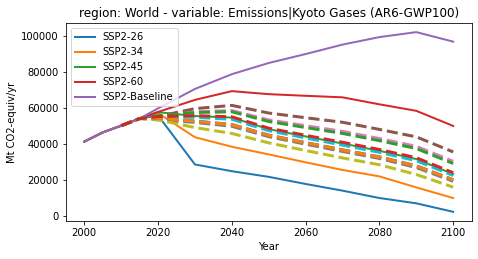

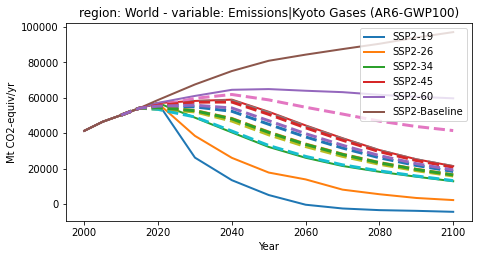

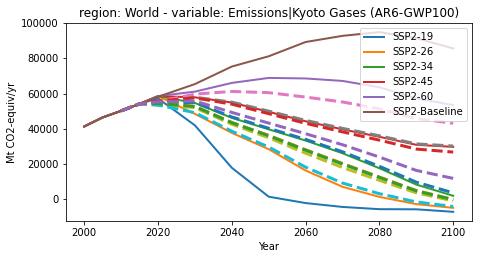

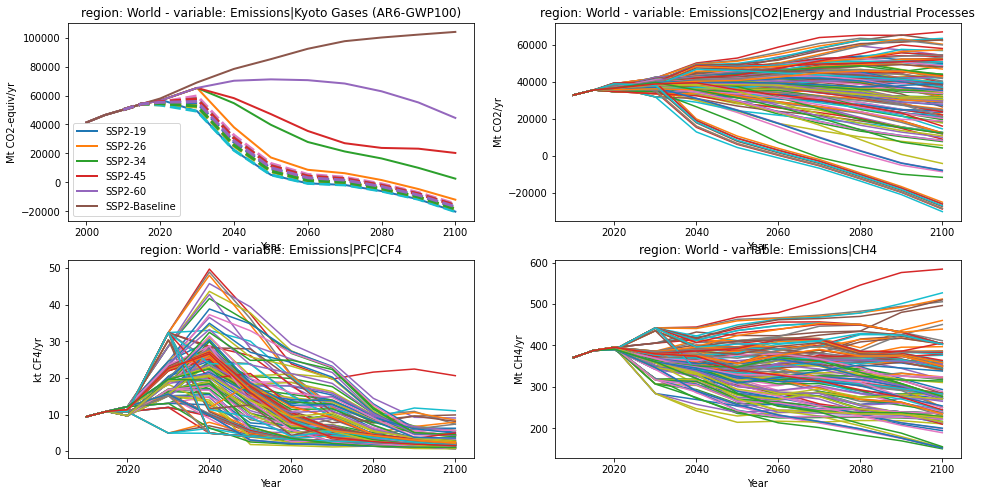

In [31]:
if price_kyoto_var == variable:
    non_co2_ind_compon = [
        co2afolu,
        "Emissions|CH4",
        "Emissions|N2O",
        "Emissions|F-Gases",
    ]    
else:
    non_co2_ind_compon = [
        "Emissions|CH4",
        "Emissions|N2O",
        "Emissions|F-Gases",
    ]
# Set up object to hold answers
try:
    del all_extensions
except:
    pass
fgas_em_inf = mi.DecomposeCollectionTimeDepRatio(harmed_sr15.filter(year=years, region="World"))
#logging.getLogger("pyam.core").setLevel(logging.CRITICAL)
for (model, scenario) in mod_scen_list:
    print ("Running model {}, scenario {}".format(model, scenario))
    infill_df = harmed_sr15.filter(model=model, scenario=scenario)
    extend_df = ExtendLatestTimeQuantile(infill_df).derive_relationship(variable=price_kyoto_var)(simplest_infill_data)
    extend_df = extend_df.append(simplest_infill_data)
    if price_kyoto_var == kyexaf:
        extend_co2afolu = ExtendLatestTimeQuantile(infill_df).derive_relationship(variable=co2afolu)(simplest_infill_data)
        extend_df = extend_df.append(extend_co2afolu)
    
    # Denote the process in the name
    extend_df = extend_df.data
    extend_df["scenario"] = extend_df["scenario"] + "|" + model + "_" + scenario[:-1] + " kyoto extended"
    extend_df = pyam.IamDataFrame(extend_df)
    
    # Plot results to ensure they are reasonable
    plt.figure(figsize=(16,8))
    ax=plt.subplot(221)
    infill_df.filter(variable=price_kyoto_var).plot(ax=ax, linewidth=2)
    extend_df.filter(variable=price_kyoto_var).plot(ax=ax, linestyle="--", linewidth=3)
    
    # Add the price-infilled values for the same model/scenario
    price_mod_scen = pyam.IamDataFrame(all_kyoto_prices).filter(scenario="*" + model + "_" + scenario[:-1])
    if price_mod_scen:
        extend_df = extend_df.append(price_mod_scen)
    infill_results = infill_components_of_partial_aggregate(
        price_kyoto_var, extend_df, infill_df, non_co2_ind_compon, co2, co2ind, 
        co2afolu, fgas_em_inf, years, fgas, fgases, hfcs
    )
    try:
        all_extensions = all_extensions.append(pyam.IamDataFrame(infill_results))
    except NameError:
        all_extensions = pyam.IamDataFrame(infill_results)
#logging.getLogger("pyam.core").setLevel(logging.WARNING)
all_extensions = pyam.IamDataFrame(all_extensions.data)
ax=plt.subplot(222)
all_extensions.filter(variable=co2ind).plot(ax=ax)
ax=plt.subplot(223)
all_extensions.filter(variable="Emissions|PFC|CF4").plot(ax=ax)
ax=plt.subplot(224)
all_extensions.filter(variable="Emissions|CH4").plot(ax=ax)

In [32]:
harmed_sr15.unit

['Mt BC/yr',
 'Mt CH4/yr',
 'Mt CO/yr',
 'Mt CO2-equiv/yr',
 'Mt CO2/yr',
 'Mt NH3/yr',
 'Mt NO2/yr',
 'Mt OC/yr',
 'Mt SO2/yr',
 'Mt VOC/yr',
 'US$2010/t CO2',
 'kt C2F6/yr',
 'kt CF4/yr',
 'kt HFC125/yr',
 'kt HFC134a/yr',
 'kt HFC143a/yr',
 'kt HFC227ea/yr',
 'kt HFC23/yr',
 'kt HFC245fa/yr',
 'kt HFC32/yr',
 'kt HFC4310mee/yr',
 'kt N2O/yr',
 'kt SF6/yr']

In [33]:
harmed_sr15.filter(variable=fgas, year=[2010, 2015]).timeseries().head()

2010  \
model       scenario      region variable          unit                        
AIM/CGE 2.0 SSP1-19       World  Emissions|F-Gases Mt CO2-equiv/yr  863.5136   
            SSP1-26       World  Emissions|F-Gases Mt CO2-equiv/yr  863.5136   
            SSP1-34       World  Emissions|F-Gases Mt CO2-equiv/yr  863.5136   
            SSP1-45       World  Emissions|F-Gases Mt CO2-equiv/yr  863.5136   
            SSP1-Baseline World  Emissions|F-Gases Mt CO2-equiv/yr  863.5136   

                                                                         2015  
model       scenario      region variable          unit                        
AIM/CGE 2.0 SSP1-19       World  Emissions|F-Gases Mt CO2-equiv/yr  1242.4126  
            SSP1-26       World  Emissions|F-Gases Mt CO2-equiv/yr  1242.4126  
            SSP1-34       World  Emissions|F-Gases Mt CO2-equiv/yr  1242.4126  
            SSP1-45       World  Emissions|F-Gases Mt CO2-equiv/yr  1242.4126  
            SSP1-Baseline World  Emissions|F-Gases Mt CO2-equiv/yr  1242.4126

In [34]:
all_extensions

<class 'pyam.core.IamDataFrame'>
Index:
 * model    : Current policies, NDC case - conditional, NDC case - unconditional (3)
 * scenario : ... (80)
Timeseries data coordinates:
   region   : World (1)
   variable : Emissions|BC, Emissions|CH4, Emissions|CO, ... Price|Carbon (28)
   unit     : Mt BC/yr, Mt CH4/yr, Mt CO/yr, Mt CO2-equiv/yr, ... kt SF6/yr (22)
   year     : 2010, 2015, 2020, 2030, 2040, 2050, 2060, 2070, ... 2100 (11)
Meta indicators:
   exclude (bool) False (1)

In [35]:
all_extensions.variable

['Emissions|BC',
 'Emissions|CH4',
 'Emissions|CO',
 'Emissions|CO2',
 'Emissions|CO2|AFOLU',
 'Emissions|CO2|Energy and Industrial Processes',
 'Emissions|F-Gases',
 'Emissions|HFC',
 'Emissions|HFC|HFC125',
 'Emissions|HFC|HFC134a',
 'Emissions|HFC|HFC143a',
 'Emissions|HFC|HFC227ea',
 'Emissions|HFC|HFC23',
 'Emissions|HFC|HFC245ca',
 'Emissions|HFC|HFC32',
 'Emissions|HFC|HFC43-10',
 'Emissions|Kyoto Gases (AR6-GWP100)',
 'Emissions|N2O',
 'Emissions|NH3',
 'Emissions|NOx',
 'Emissions|OC',
 'Emissions|PFC|C2F6',
 'Emissions|PFC|C6F14',
 'Emissions|PFC|CF4',
 'Emissions|SF6',
 'Emissions|Sulfur',
 'Emissions|VOC',
 'Price|Carbon']

In [36]:
# Synthesize the Kyoto total (usually only required if variable != kyoto total)
kyoto_emissions = [
    'Emissions|CO2|Energy and Industrial Processes',
    'Emissions|CO2|AFOLU',
    'Emissions|CH4',
    'Emissions|N2O',
    'Emissions|SF6',
    'Emissions|PFC|*',
    'Emissions|HFC'
]
all_extensions_kyoto = _construct_consistent_values(
    variable, kyoto_emissions, convert_units_to_MtCO2_equiv(
        all_extensions.filter(variable=kyoto_emissions), metric_name="AR6GWP100"
    )
)

In [37]:
tmp = all_extensions_kyoto.filter(year=2015).data
assert np.allclose(tmp.value.unique(), tmp.value[0])
assert pyam.compare(all_extensions_kyoto.filter(year=2030), 
                 all_extensions.filter(year=2030, variable=variable), drop_close=True).size == 0

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

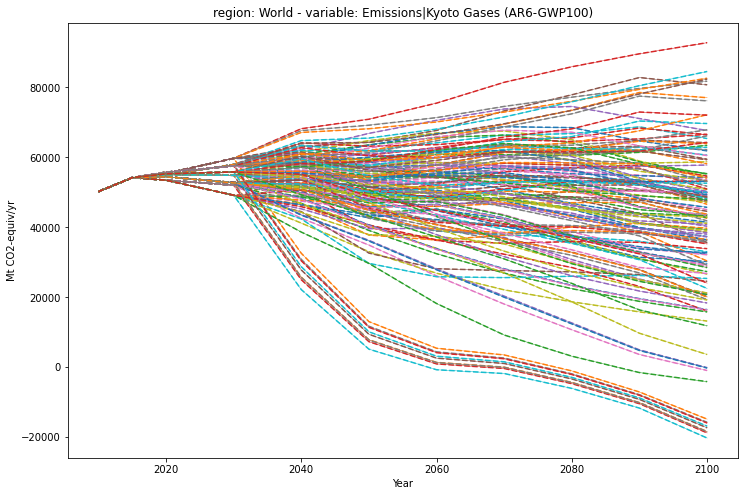

In [38]:
plt.figure(figsize=(12,8))
ax = plt.subplot(111)
all_extensions.filter(variable=variable).plot(ax=ax, linewidth = 0.5)
plt.gca().set_prop_cycle(None)
all_extensions_kyoto.plot(linestyle="--", ax=ax)

In [39]:
all_extensions = all_extensions.filter(variable=variable, keep=False).append(all_extensions_kyoto)

# Plot and investigate

In [40]:
assert all_extensions.check_aggregate(co2) == None

In [41]:
assert all_extensions.check_aggregate_region(co2) == None

pyam.aggregation - INFO: Cannot aggregate variable 'Emissions|CO2' to 'World' because it does not exist in any subregion!


pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|CO2'}, xlabel='Year', ylabel='Mt CO2/yr'>

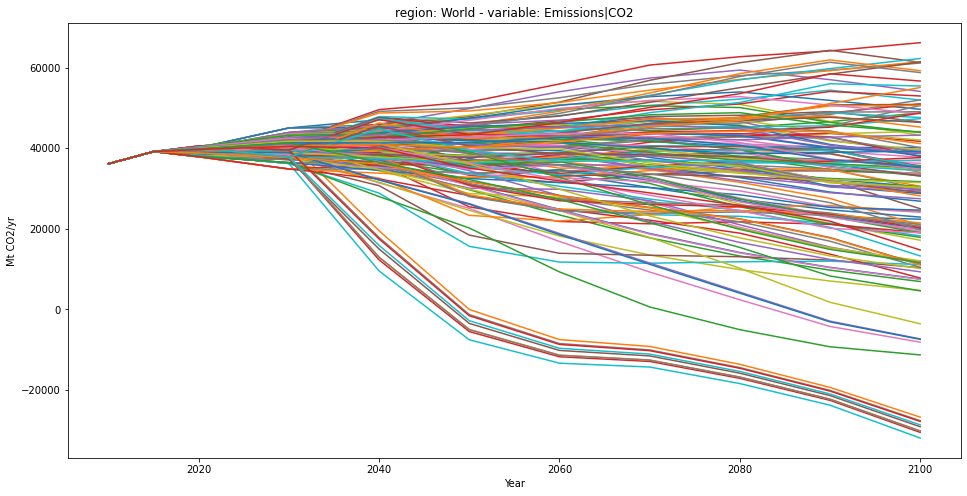

In [42]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=co2, region="World").plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


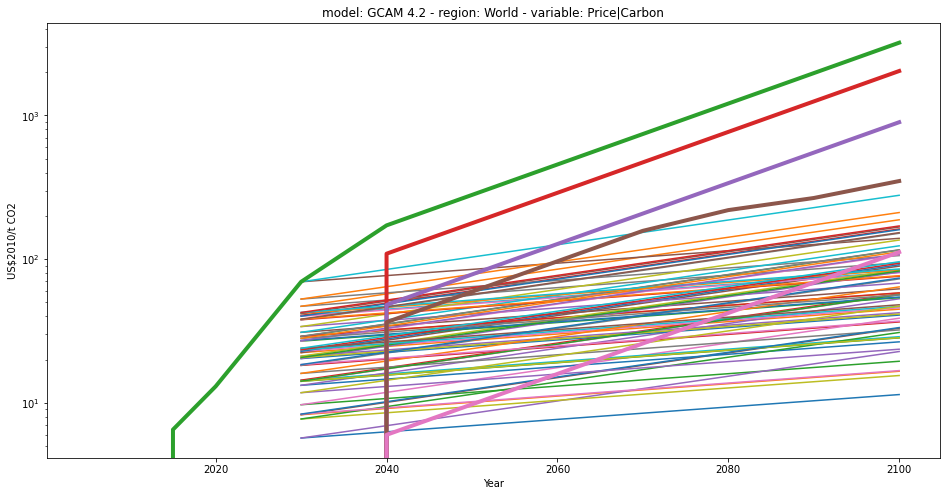

In [43]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=price, scenario="*incr*").plot(ax=ax)
harmed_sr15.filter(variable=price, model=model, scenario=scenario).plot(ax=ax, linewidth=4)
plt.yscale("log")

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: GCAM 4.2 - region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

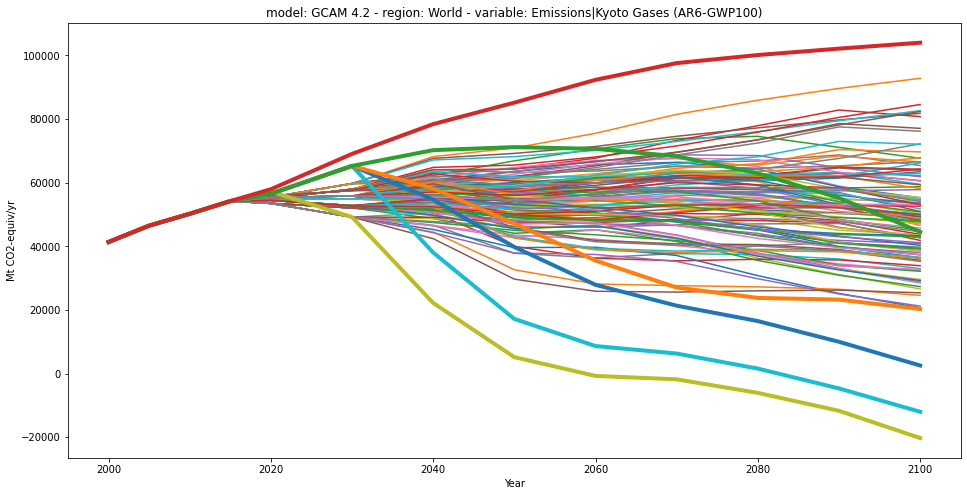

In [44]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=price_kyoto_var).filter(scenario=["*incr*", "*_prescribed*"]).plot(ax=ax)
harmed_sr15.filter(variable=price_kyoto_var, model=model, scenario=scenario).plot(ax=ax, linewidth=4)

In [45]:
assert len(all_extensions.filter(variable="Emissions|SF6", year=2015).data.value.unique()) == 1

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|SF6'}, xlabel='Year', ylabel='kt SF6/yr'>

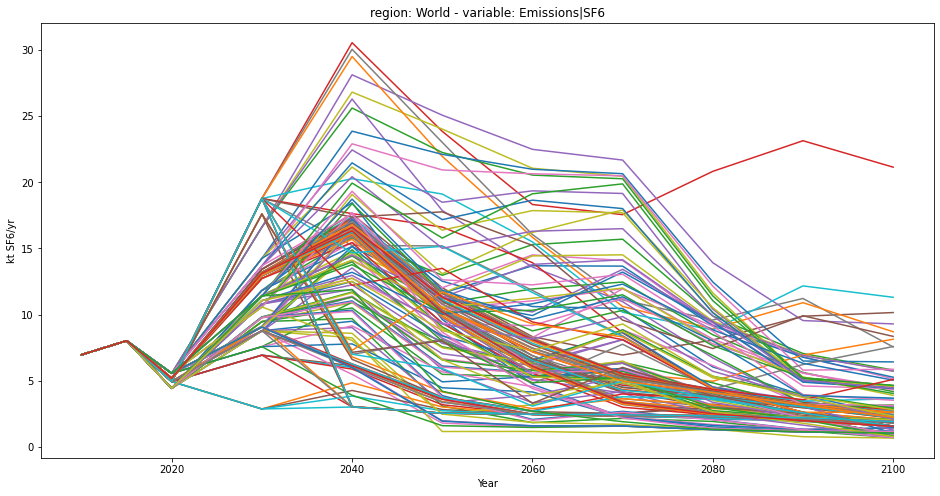

In [46]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable="Emissions|SF6").plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|F-Gases'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

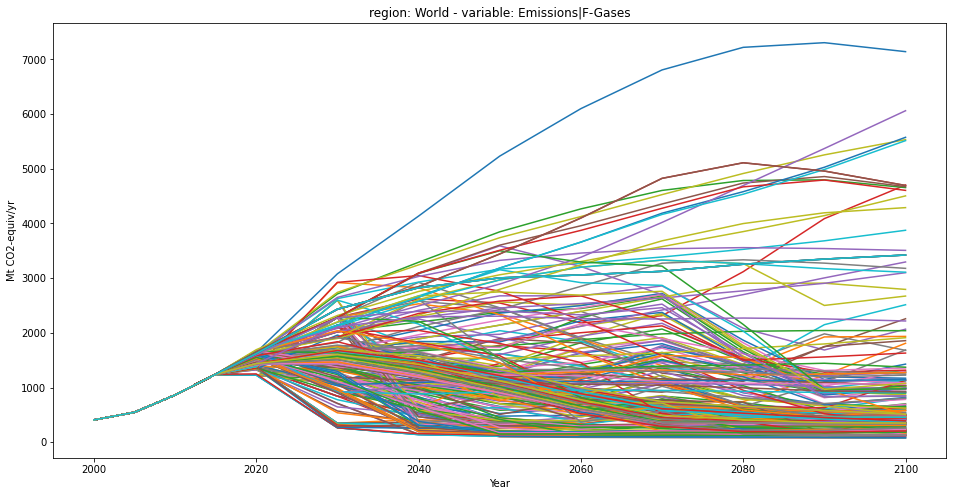

In [47]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable="Emissions|F-Gases").plot(ax=ax)
harmed_sr15.filter(variable="Emissions|F-Gases").plot(ax=ax)

In [48]:
all_extensions.filter(variable="Emissions|F-Gases").model

['Current policies', 'NDC case - conditional', 'NDC case - unconditional']

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

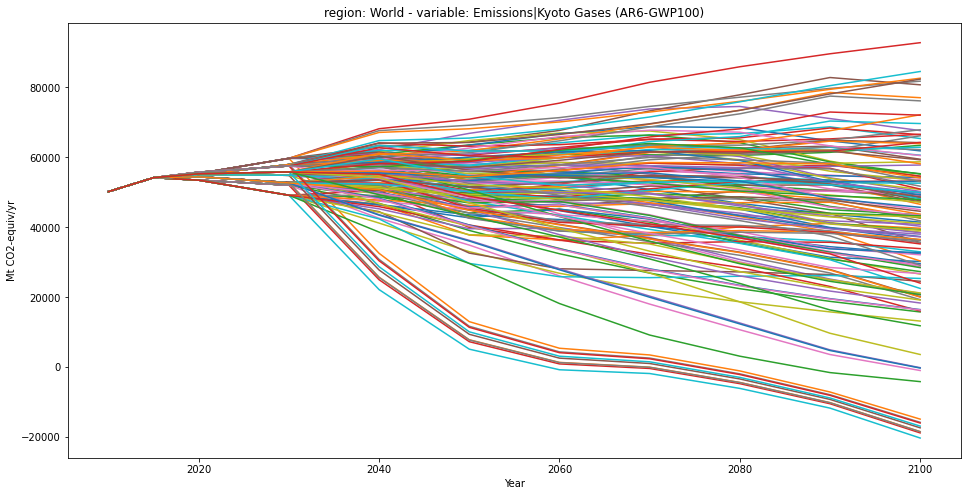

In [49]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=variable).plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|NOx'}, xlabel='Year', ylabel='Mt NO2/yr'>

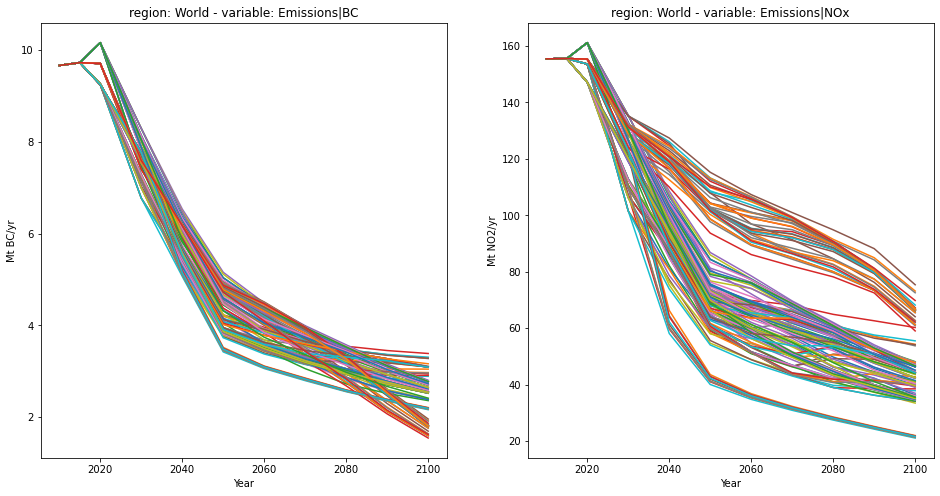

In [50]:
plt.figure(figsize=(16, 8))
ax=plt.subplot(121)
all_extensions.filter(variable="Emissions|BC").plot(ax=ax)
ax=plt.subplot(122)
all_extensions.filter(variable="Emissions|NOx").plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|CO2|AFOLU'}, xlabel='Year', ylabel='Mt CO2/yr'>

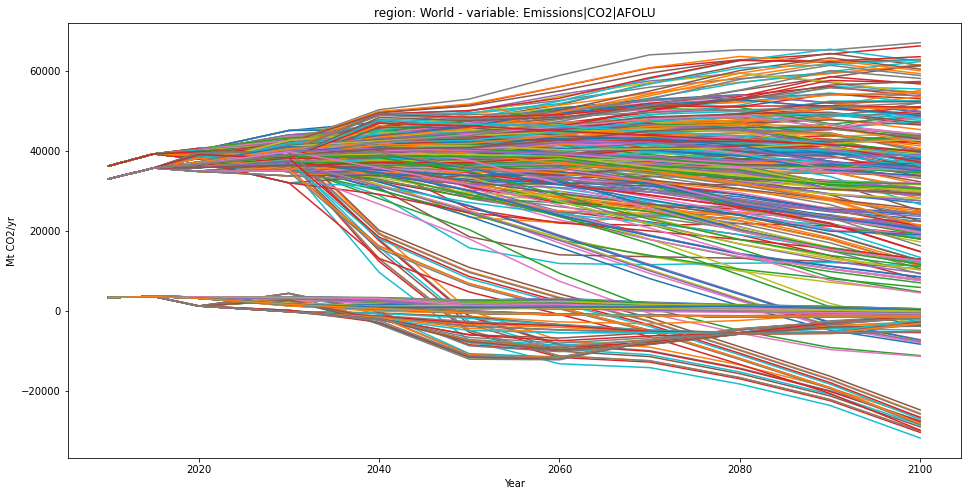

In [51]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=co2, scenario="*SSP2*").plot(ax=ax)
all_extensions.filter(variable=co2ind, scenario="*SSP2*").plot(ax=ax)
all_extensions.filter(variable=co2afolu, scenario="*SSP2*").plot(ax=ax)

In [52]:
# Rename an awkward unit
all_extensions = all_extensions.data
vars_to_convert = [
    "HFC245ca", "C6F14"
]
for var in vars_to_convert:
    ind = [var in y for y in all_extensions["variable"]]
    assert (all_extensions.iloc[ind].value == 0).all()
    index = all_extensions[ind].index
    all_extensions.loc[index, "unit"] = all_extensions.loc[index, "unit"].str.replace(
        "Mt CO2-equiv", "kt " + var)
all_extensions = pyam.IamDataFrame(all_extensions)

In [53]:
all_extensions_orig = all_extensions.copy()

# Effects of net zero
To investigate the effects of net zero, we must estimate the fraction of the data coming from specific regions. This takes the following steps: 
1) Infill each region from the global totals for the whole timeseries (note that this uses the ratios of emissions without harmonisation)

2) Calculate the fraction of each region that corresponds to a country using the CAIT database for 2020

3) Take the subset of countries with 2030 agreements and take their fractions of the regional Kyoto totals to 0

We only want to do this to the scenarios that did not originally extend beyond 2030

In [54]:
regions = harmed_sr15_regions.region
regions = [reg for reg in regions if reg not in ["R5ROWO", "World"]]
regions

['R5ASIA', 'R5LAM', 'R5MAF', 'R5OECD90+EU', 'R5REF']

In [55]:
harmed_sr15_regions.filter(variable=co2afolu, region="R5LAM").filter(year=2030).data

,model,scenario,region,variable,unit,year,value
0,AIM/CGE 2.0,SSP1-19,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-166.320981
1,AIM/CGE 2.0,SSP1-26,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-16.324499
2,AIM/CGE 2.0,SSP1-34,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,57.259507
3,AIM/CGE 2.0,SSP1-45,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,701.633075
4,AIM/CGE 2.0,SSP1-Baseline,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,234.737996
...,...,...,...,...,...,...,...
121,WITCH-GLOBIOM 3.1,SSP4-Baseline,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,1002.958448
122,WITCH-GLOBIOM 3.1,SSP5-34,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-35.705206
123,WITCH-GLOBIOM 3.1,SSP5-45,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,519.483553
124,WITCH-GLOBIOM 3.1,SSP5-60,R5LAM,Emissions|CO2|AFOLU,Mt CO2/yr,2030,1050.452267


In [56]:
last_infill_region="R5LAM"
try:
    del regions_added
except:
    pass

for (model, scenario) in mod_scen_list:
    # Manipulate the info on regions into the variable name in the all-regions database
    sr15_all_regswap = harmed_sr15_regions.filter(scenario=scenario, model=model).data
    sr15_all_regswap_var = set(sr15_all_regswap.variable.copy()) - set([co2afolu])
    sr15_all_regswap["variable"] = sr15_all_regswap["variable"] + "_" + sr15_all_regswap["region"]
    sr15_all_regswap["region"] = "suspend"
    sr15_all_regswap = pyam.IamDataFrame(sr15_all_regswap)
    regional_downscaler = mi.DecomposeCollectionTimeDepRatio(sr15_all_regswap)
    regional_remainder_downscaler = mi.SplitCollectionWithRemainderEmissions(sr15_all_regswap)
    
    # find the appropriate aspect of the database to be infilled and rename it
    region_to_infill = all_extensions_orig.filter(scenario="*" + model + "*" + scenario)
    region_to_infill_variables = region_to_infill.variable
    region_to_infill = region_to_infill.data
    region_to_infill["variable"] = region_to_infill["variable"] + "_" + region_to_infill["region"]
    region_to_infill["region"] = "suspend"
    region_to_infill = pyam.IamDataFrame(region_to_infill)
    
    # Infill all times
    # CO2 AFOLU is infilled using remainders as we have a sign difference in the target database in 2030. Latin America
    # has the highest uncertainty and so is infilled last
    new_regional = regional_remainder_downscaler.infill_components(
        co2afolu + "_World", 
        [co2afolu + "_" + reg for reg in regions if reg != last_infill_region], 
        co2afolu + "_" + last_infill_region,
        region_to_infill,
        metric_name="AR6GWP100"
    )
    try:
        regions_added = regions_added.append(new_regional)
    except NameError:
        regions_added = new_regional.copy()
    for var in regional_emtype:
        if var in sr15_all_regswap_var:
            # This will produce an irritating number of warnings about negative values
            sys.stdout = open(os.devnull, 'w')
            new_regional = regional_downscaler.infill_components(
                var + "_World", [var + "_" + reg for reg in regions], 
                region_to_infill.filter(variable=var+"_*")
            )
            sys.stdout = stdout
            regions_added = regions_added.append(new_regional)
    
regions_added = regions_added.data
regions_added.region = [s.split("_")[1] for s in regions_added.variable] 
regions_added.variable = [s.split("_")[0] for s in regions_added.variable]
regions_added = pyam.IamDataFrame(regions_added)

silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead variable ['Emissions|CO2|Energy and Industrial Processes_World'] goes negative. The time dependent ratio cruncher can produce unexpected results in this case.
silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead variable ['Emissions|CO2|Energy and Industrial Processes_World'] goes negative. The time dependent ratio cruncher can produce unexpected results in this case.
silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead variable ['Emissions|CO2|Energy and Industrial Processes_World'] goes negative. The time dependent ratio cruncher can produce unexpected results in this case.
silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead variable ['Emissions|CO2|Energy and Industrial Processes_World'] goes negative. The time dependent ratio cruncher can produce unexpected results in this case.
silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead

In [57]:
regions_added.region

['R5ASIA', 'R5LAM', 'R5MAF', 'R5OECD90+EU', 'R5REF']

In [58]:
harmed_sr15_regions.region

['R5ASIA', 'R5LAM', 'R5MAF', 'R5OECD90+EU', 'R5REF', 'World']

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: GCAM 4.2 - region: R5LAM - variable: Emissions|CO2|AFOLU'}, xlabel='Year', ylabel='Mt CO2/yr'>

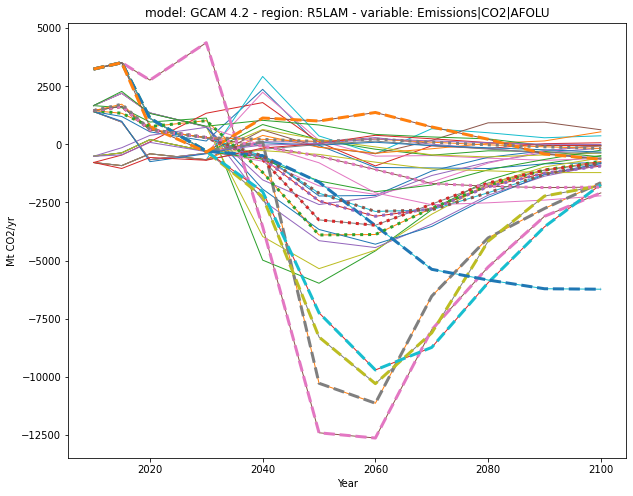

In [59]:
plt.figure(figsize = (10, 8))
ax = plt.subplot(111)
harmed_sr15_regions.filter(variable='Emissions|CO2|AFOLU', model=model, scenario=scenario).plot(ax=ax, linewidth=1)
harmed_sr15_regions.filter(
    variable='Emissions|CO2|AFOLU', model=model, scenario=scenario, region="World").plot(ax=ax, linestyle="--", linewidth=3)
harmed_sr15_regions.filter(
    variable='Emissions|CO2|AFOLU', model=model, scenario=scenario, region="R5LAM").plot(ax=ax, linestyle=":", linewidth=3)


pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'variable: Emissions|CO2|AFOLU'}, xlabel='Year', ylabel='Mt CO2/yr'>

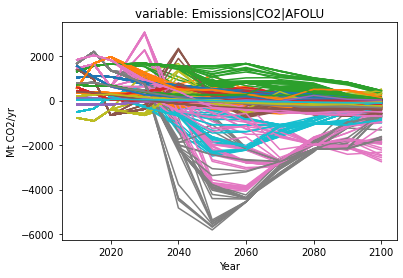

In [60]:
regions_added.filter(variable=co2afolu).plot()

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: GCAM 4.2 - region: suspend - variable: Emissions|CO2|AFOLU_World'}, xlabel='Year', ylabel='Mt CO2/yr'>

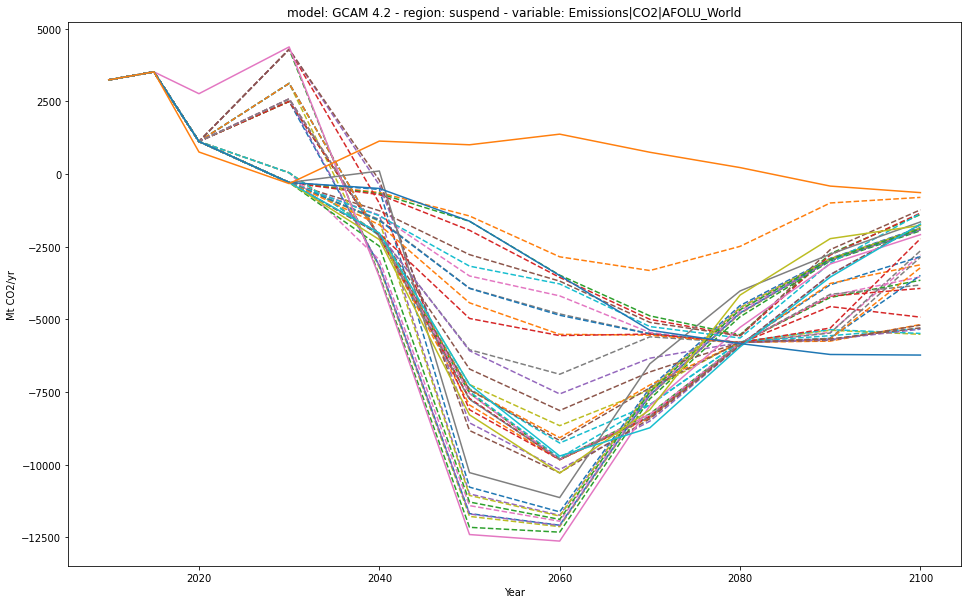

In [61]:
plt.figure(figsize = (16, 10))
ax = plt.subplot(111)
region_to_infill.filter(variable='Emissions|CO2|AFOLU_World').plot(ax=ax, linestyle="--")
sr15_all_regswap.filter(variable='Emissions|CO2|AFOLU_World').plot(ax=ax)

In [62]:
kyoto = "Emissions|Kyoto Gases (AR6-GWP100)"
regions_kyoto = _construct_consistent_values(
    kyoto, regional_emtype, convert_units_to_MtCO2_equiv(regions_added, metric_name="AR6GWP100")
)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

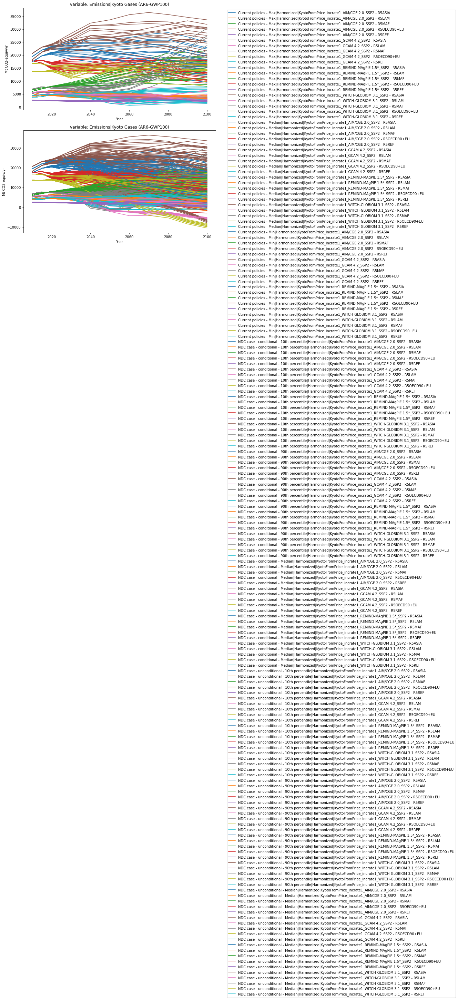

In [63]:
fig = plt.figure(figsize=(10,12))
ax = plt.subplot(2, 1, 1)
regions_kyoto.filter(scenario="*Kyoto*incrate1*SSP2*").plot(ax=ax)
plt.legend( bbox_to_anchor=(1.05, 1), loc='upper left')
ax = plt.subplot(2, 1, 2)
regions_kyoto.plot(ax=ax)

In [64]:
regions_kyoto.filter(scenario="*Kyoto*incrate1*SSP2*").scenario

['10th percentile|Harmonized|KyotoFromPrice_incrate1_AIM/CGE 2.0_SSP2',
 '10th percentile|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2_SSP2',
 '10th percentile|Harmonized|KyotoFromPrice_incrate1_REMIND-MAgPIE 1.5*_SSP2',
 '10th percentile|Harmonized|KyotoFromPrice_incrate1_WITCH-GLOBIOM 3.1_SSP2',
 '90th percentile|Harmonized|KyotoFromPrice_incrate1_AIM/CGE 2.0_SSP2',
 '90th percentile|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2_SSP2',
 '90th percentile|Harmonized|KyotoFromPrice_incrate1_REMIND-MAgPIE 1.5*_SSP2',
 '90th percentile|Harmonized|KyotoFromPrice_incrate1_WITCH-GLOBIOM 3.1_SSP2',
 'Max|Harmonized|KyotoFromPrice_incrate1_AIM/CGE 2.0_SSP2',
 'Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2_SSP2',
 'Max|Harmonized|KyotoFromPrice_incrate1_REMIND-MAgPIE 1.5*_SSP2',
 'Max|Harmonized|KyotoFromPrice_incrate1_WITCH-GLOBIOM 3.1_SSP2',
 'Median|Harmonized|KyotoFromPrice_incrate1_AIM/CGE 2.0_SSP2',
 'Median|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2_SSP2',
 'Median|Harmonized|KyotoFromPr

## Check regional split

In [65]:
regions_added.filter(scenario="*SSP2").check_aggregate_region(variable="Emissions|N2O")
regions_kyoto.check_aggregate_region(variable=kyoto)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

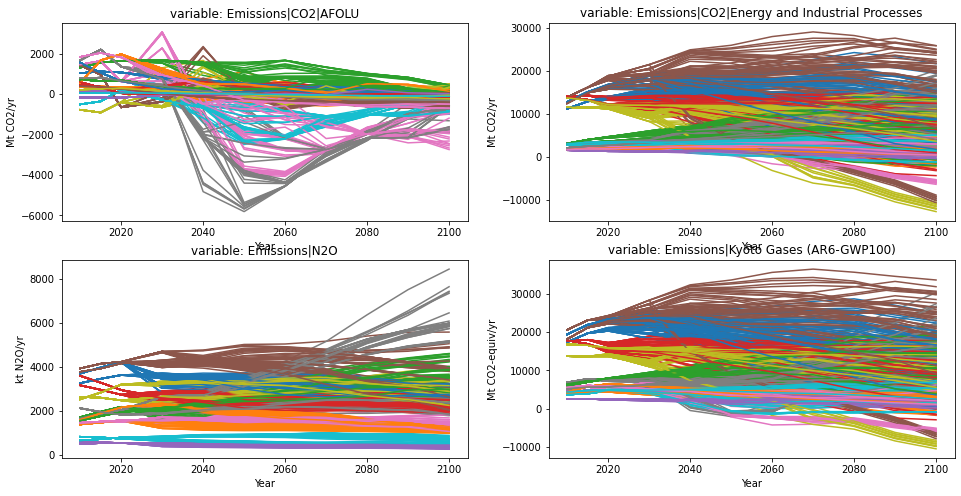

In [66]:
plt.figure(figsize=(16, 8))
ax = plt.subplot(2, 2, 1)
regions_added.filter(variable="*CO2|AFOLU").plot(ax=ax)
ax = plt.subplot(2, 2, 2)
regions_added.filter(variable=co2ind).plot(ax=ax)
ax=plt.subplot(2, 2, 3)
regions_added.filter(variable="*N2O").plot(ax=ax)
ax=plt.subplot(2, 2, 4)
regions_kyoto.filter(variable=kyoto).plot(ax=ax)

pyam.core - WARNING: Filtered IamDataFrame is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!


<AxesSubplot:title={'center':'model: MESSAGE-GLOBIOM 1.0 - region: R5LAM - variable: Emissions|CO2|AFOLU'}, xlabel='Year', ylabel='Mt CO2/yr'>

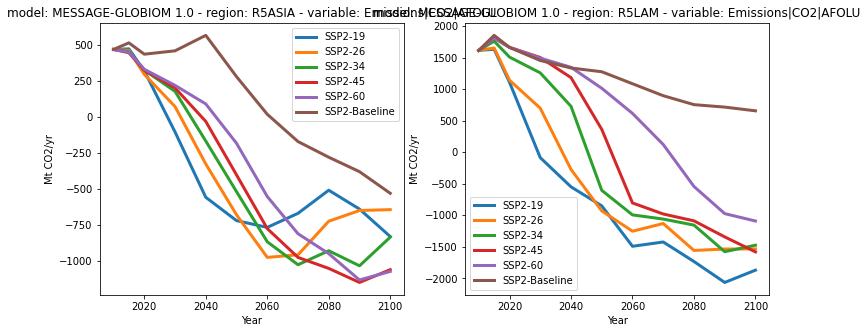

In [67]:
# Asia has a sudden negative lurch in AFOLU in some models, but not in MESSAGE. 
plt.figure(figsize=(12, 5))
ax = plt.subplot(121)
regions_added.filter(variable="*CO2|AFOLU", scenario="*MESSAGE-GLOBIOM*").filter(region="R5ASIA").plot(ax=ax, linewidth=1)
harmed_sr15_regions.filter(
    variable="Emissions|CO2|AFOLU", scenario="SSP2*", model="MESSAGE-GLOBIOM*", region="R5ASIA"
).plot(ax=ax, linewidth=3)
ax=plt.subplot(122)
regions_added.filter(variable="*CO2|AFOLU", scenario="*MESSAGE-GLOBIOM*").filter(region="R5LAM").plot(ax=ax, linewidth=1)
harmed_sr15_regions.filter(
    variable="Emissions|CO2|AFOLU", scenario="SSP2*", model="MESSAGE-GLOBIOM*", region="R5LAM"
).plot(ax=ax, linewidth=3)

pyam.core - WARNING: Filtered IamDataFrame is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!


<AxesSubplot:title={'center':'model: MESSAGE-GLOBIOM 1.0 - region: R5ASIA - variable: Emissions|CO2|Energy and Industrial Processes'}, xlabel='Year', ylabel='Mt CO2/yr'>

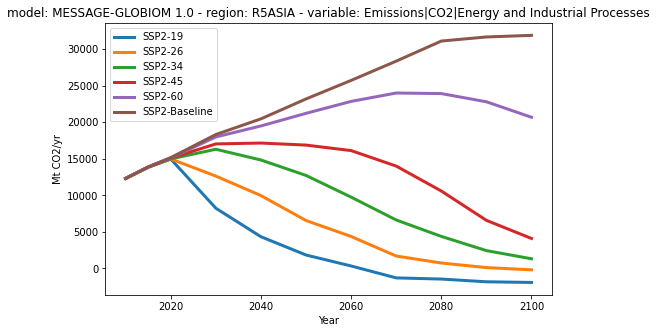

In [68]:
plt.figure(figsize=(8, 5))
ax = plt.subplot(111)
regions_added.filter(variable=co2ind, scenario="*MESSAGE-GLOBIOM*").filter(region="R5ASIA").plot(ax=ax)
harmed_sr15_regions.filter(variable=co2ind, scenario="SSP2*", model="MESSAGE-GLOBIOM*", region="R5ASIA").plot(
    ax=ax, linewidth=3)

In [69]:
regions_added.model

['Current policies', 'NDC case - conditional', 'NDC case - unconditional']

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: MESSAGE-GLOBIOM 1.0 - scenario: SSP2-34 - variable: Emissions|CO2|AFOLU'}, xlabel='Year', ylabel='Mt CO2/yr'>

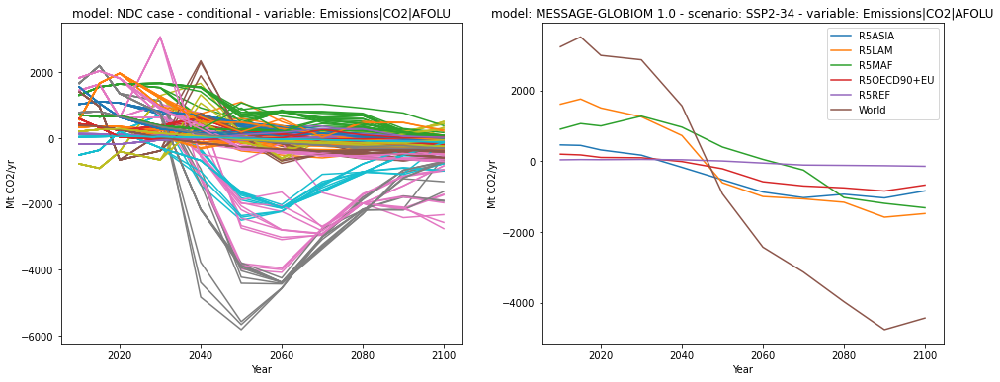

In [70]:
plt.figure(figsize=(16, 6))
ax=plt.subplot(121)
regions_added.filter(
    variable=co2afolu,
    model="NDC case - conditional"
).plot(ax=ax)
ax=plt.subplot(122)
harmed_sr15_regions.filter(variable=co2afolu, scenario="SSP2-34", model="MESSAGE-GLOBIOM*").plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: MESSAGE-GLOBIOM 1.0 - scenario: SSP2-34 - variable: Emissions|CO2|Energy and Industrial Processes'}, xlabel='Year', ylabel='Mt CO2/yr'>

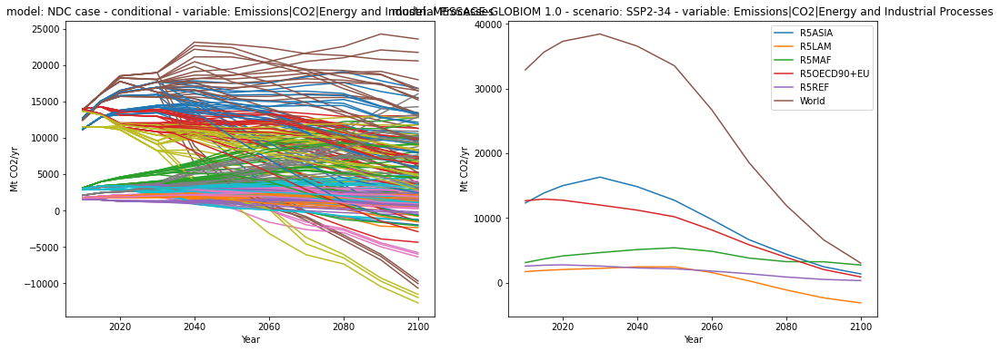

In [71]:
plt.figure(figsize=(16, 6))
ax=plt.subplot(121)
regions_added.filter(
    variable=co2ind, 
    model="NDC case - conditional", 
).plot(ax=ax)
ax=plt.subplot(122)
harmed_sr15_regions.filter(variable=co2ind, scenario="SSP2-34", model="MESSAGE-GLOBIOM*").plot(ax=ax)

## Import CAIT data
This comes in two parts, with and without LUCF

In [72]:
convert_country = country_converter.CountryConverter()
# Use the conversion table that I extracted from the witchtools r package
converter = pd.read_csv("../input/r5_conversion_table.csv", index_col=0)
converter.r5 = converter.r5.str.upper()
converter.r5[converter.r5 == "R5OECD"] = "R5OECD90+EU"
converter = converter.append(pd.DataFrame({"r5": "R5OECD90+EU", "iso3": "EU"}, index=[253]))
converter = converter.set_index("iso3")
converter.r5.unique()

array(['R5OECD90+EU', 'R5ASIA', 'R5LAM', 'R5MAF', 'R5REF'], dtype=object)

In [73]:
cait_folder = "../input/CAIT/"
cait_data = pd.read_csv(
    cait_folder + "historical_emissions.csv"
)
cait_data["variable"] = variable
cait_data["iso3"] = convert_country.convert(cait_data["Country"], to="iso3")
cait_data = cait_data.loc[cait_data.Country != "World", :]
cait_data.loc[cait_data.Country == "European Union (27)", "iso3"] = "EU"
cait_data["region"] = converter.r5.loc[cait_data.iso3.values].values

country_converter.country_converter - WARNING: World not found in regex
country_converter.country_converter - WARNING: European Union (27) not found in regex


In [74]:
# Add EU membership data. The UK is not in EU28 but we don't have an updated version, so 
# subtract by hand
cait_data["eu_membership"] = convert_country.convert(
    [iso.replace("GBR", "IRN") for iso in cait_data.iso3], to="EU28")
# Update the definition of R5OECD90+EU
cait_data.loc[cait_data["eu_membership"]=="EU28", "region"] = "R5OECD90+EU"

country_converter.country_converter - WARNING: EU not found in ISO2


In [75]:
cait_data.head()

,Country,Data source,Sector,Gas,Unit,2019,2018,2017,2016,2015,...,1995,1994,1993,1992,1991,1990,variable,iso3,region,eu_membership
1,China,CAIT,Total including LUCF,All GHG,MtCO₂e,12055.41,11821.66,11385.48,11151.31,11108.86,...,3960.71,3557.37,3397.80,3168.05,3039.15,2891.73,Emissions|Kyoto Gases (AR6-GWP100),CHN,R5ASIA,NaN
2,United States,CAIT,Total including LUCF,All GHG,MtCO₂e,5771.00,5892.37,5689.61,5743.85,5665.21,...,5729.69,5661.57,5567.55,5456.12,5372.08,5417.32,Emissions|Kyoto Gases (AR6-GWP100),USA,R5OECD90+EU,NaN
3,India,CAIT,Total including LUCF,All GHG,MtCO₂e,3363.60,3360.56,3215.07,3076.48,3003.07,...,1223.65,1158.48,1114.22,1081.28,1056.25,1002.56,Emissions|Kyoto Gases (AR6-GWP100),IND,R5ASIA,NaN
4,European Union (27),CAIT,Total including LUCF,All GHG,MtCO₂e,3149.57,3295.53,3379.38,3364.77,3019.49,...,3947.64,3894.63,3908.95,3981.08,4120.94,4187.90,Emissions|Kyoto Gases (AR6-GWP100),EU,R5OECD90+EU,not found
5,Indonesia,CAIT,Total including LUCF,All GHG,MtCO₂e,1959.71,1692.36,1447.22,1434.46,2067.75,...,1339.10,1302.70,1282.35,1266.98,1246.27,1226.82,Emissions|Kyoto Gases (AR6-GWP100),IDN,R5ASIA,NaN


In [76]:
region_totals = cait_data.groupby(["region", "variable"])["2019"].sum()
region_totals = region_totals.reset_index("variable")["2019"]
region_totals

region
R5ASIA         20373.88
R5LAM           4039.03
R5MAF           6765.47
R5OECD90+EU    16378.96
R5REF           3521.00
Name: 2019, dtype: float64

In [77]:
cait_data["region_fraction"] = cait_data["2018"].values / region_totals[cait_data["region"]].values
cait_data.head(10)

,Country,Data source,Sector,Gas,Unit,2019,2018,2017,2016,2015,...,1994,1993,1992,1991,1990,variable,iso3,region,eu_membership,region_fraction
1,China,CAIT,Total including LUCF,All GHG,MtCO₂e,12055.41,11821.66,11385.48,11151.31,11108.86,...,3557.37,3397.80,3168.05,3039.15,2891.73,Emissions|Kyoto Gases (AR6-GWP100),CHN,R5ASIA,NaN,0.580236
2,United States,CAIT,Total including LUCF,All GHG,MtCO₂e,5771.00,5892.37,5689.61,5743.85,5665.21,...,5661.57,5567.55,5456.12,5372.08,5417.32,Emissions|Kyoto Gases (AR6-GWP100),USA,R5OECD90+EU,NaN,0.359752
3,India,CAIT,Total including LUCF,All GHG,MtCO₂e,3363.60,3360.56,3215.07,3076.48,3003.07,...,1158.48,1114.22,1081.28,1056.25,1002.56,Emissions|Kyoto Gases (AR6-GWP100),IND,R5ASIA,NaN,0.164945
4,European Union (27),CAIT,Total including LUCF,All GHG,MtCO₂e,3149.57,3295.53,3379.38,3364.77,3019.49,...,3894.63,3908.95,3981.08,4120.94,4187.90,Emissions|Kyoto Gases (AR6-GWP100),EU,R5OECD90+EU,not found,0.201205
5,Indonesia,CAIT,Total including LUCF,All GHG,MtCO₂e,1959.71,1692.36,1447.22,1434.46,2067.75,...,1302.70,1282.35,1266.98,1246.27,1226.82,Emissions|Kyoto Gases (AR6-GWP100),IDN,R5ASIA,NaN,0.083065
6,Russia,CAIT,Total including LUCF,All GHG,MtCO₂e,1924.82,1868.15,1769.69,1733.91,1602.81,...,1995.87,2233.86,2428.18,2585.28,2648.36,Emissions|Kyoto Gases (AR6-GWP100),RUS,R5REF,NaN,0.530574
7,Brazil,CAIT,Total including LUCF,All GHG,MtCO₂e,1451.63,1434.51,1475.82,1455.86,1366.89,...,1697.94,1681.12,1669.79,1659.83,1638.68,Emissions|Kyoto Gases (AR6-GWP100),BRA,R5LAM,NaN,0.355162
8,Japan,CAIT,Total including LUCF,All GHG,MtCO₂e,1134.45,1172.32,1214.59,1229.82,1220.73,...,1185.98,1128.24,1134.81,1121.71,1106.26,Emissions|Kyoto Gases (AR6-GWP100),JPN,R5OECD90+EU,NaN,0.071575
9,Iran,CAIT,Total including LUCF,All GHG,MtCO₂e,893.78,925.58,912.77,881.05,844.14,...,394.82,362.41,354.38,332.58,304.22,Emissions|Kyoto Gases (AR6-GWP100),IRN,R5MAF,NaN,0.136809
10,Canada,CAIT,Total including LUCF,All GHG,MtCO₂e,774.29,776.50,757.38,740.67,841.22,...,631.24,613.16,617.15,602.81,606.91,Emissions|Kyoto Gases (AR6-GWP100),CAN,R5OECD90+EU,NaN,0.047408


In [78]:
eu_tot = cait_data.groupby(["eu_membership", "variable", "region"]).sum().reset_index()
eu_tot["iso3"] = "EU"
eu_tot["Country/Region"] = "EU"
eu_tot

,eu_membership,variable,region,2019,2018,2017,2016,2015,2014,2013,...,1996,1995,1994,1993,1992,1991,1990,region_fraction,iso3,Country/Region
0,EU28,Emissions|Kyoto Gases (AR6-GWP100),R5OECD90+EU,3149.58,3295.53,3379.39,3364.75,3019.46,2962.69,3109.55,...,4058.48,3947.64,3894.60,3908.96,3981.08,4120.92,4187.89,0.201205,EU,EU
1,not found,Emissions|Kyoto Gases (AR6-GWP100),R5OECD90+EU,3149.57,3295.53,3379.38,3364.77,3019.49,2962.68,3109.55,...,4058.46,3947.64,3894.63,3908.95,3981.08,4120.94,4187.90,0.201205,EU,EU


## Import latest net zero commitments
These are used to construct the expected evolution towards zero emissions


In [79]:
nzcoms = pd.read_excel(
    "../input/Analysis_update_12-14 (2).xlsx", 
    header=[2], sheet_name="12-14"
)
nzcoms = nzcoms.rename(columns={"Unnamed: 0": "Country"})
nzcoms.head(10)

,Country,Unnamed: 1,Unit,Year,Total,2020.0,Year.1,Total.1,Total.2,"Emissions (MtCO2e/yr, 2019)",...,Published plan assessment notes,Current policy trends (and 2020 emission estimates where relevant) - assessment notes for 10% threshold,Source Current Policy projection trends,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,NDC on downward path (2030 emissions at least 10% below last historic data point),Current policy projection on downward path (2030 emissions at least 10% below last historic data point)
0,Argentina,ARG,MtCO2e/yr,2016.0,378.0,390.0,2030.0,375.0,424.0,398.91,...,See 'CAT_NZ_Nov22' sheet,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N
1,Australia,AUS,MtCO2e/yr,2020.0,503.0,508.0,2030.0,347.0,458.0,608.49,...,See 'CAT_NZ_Nov22' sheet,3 of 5 says no. Nascimento et al 2022 reports ...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y
2,Brazil,BRA,MtCO2e/yr,2018.0,1366.0,1568.0,2030.0,1268.0,1541.0,1451.63,...,See 'CAT_NZ_Nov22' sheet,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N
3,Canada,CAN,MtCO2e/yr,2020.0,638.0,642.0,2030.0,427.0,621.0,774.29,...,See 'CAT_NZ_Nov22' sheet,"3 of 4 says no, incl. official projection. Onl...",Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y
4,China,CHN,MtCO2e/yr,2018.0,12233.0,12935.0,2030.0,14092.0,14705.0,12055.41,...,See 'CAT_NZ_Nov22' sheet,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N
5,European Union,EU27,MtCO2e/yr,2020.0,3043.0,3046.0,2030.0,2146.0,2426.0,3149.57,...,See 'CAT_NZ_Nov22' sheet,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,y,NaN,Y,Y
6,India,IND,MtCO2e/yr,2018.0,2692.0,3027.0,2030.0,4934.0,4893.0,3363.59,...,See 'CAT_NZ_Nov22' sheet,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N
7,Indonesia,IDN,MtCO2e/yr,2016.0,1491.0,1645.0,2030.0,2130.0,1877.0,1959.71,...,See 'CAT_NZ_Nov22' sheet,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N
8,Japan,JPN,MtCO2e/yr,2020.0,1070.0,1082.0,2030.0,767.0,982.0,1134.45,...,See 'CAT_NZ_Nov22' sheet,2 of 3 says no. Only CAT lower bound projects ...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y
9,Mexico,MEX,MtCO2e/yr,2017.0,577.0,658.0,2030.0,772.0,725.0,670.84,...,See 'CAT_NZ_Nov22' sheet,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N


In [80]:
# The structure of the table has changed to add a current policy column. We remove this for comparability 
# with the previous protocol.
assert "Total.3" in nzcoms.columns
nzcoms["Total.2"] = nzcoms["Total.3"]
del nzcoms["Total.3"]
col2030 = "Total.1"

In [81]:
confidence_cols = [0.1]
currentcol = 2020.0

In [82]:
nzcoms = nzcoms.rename(columns={"Unnamed: 1": "iso3"})

In [83]:
# Remove irrelevant items
nzcoms = nzcoms.iloc[[x not in ["No NetZero target", "No NDC data"] for x in nzcoms[currentcol].values]]
nzcoms = nzcoms.iloc[[x not in ["No NetZero target", "No NDC data"] for x in nzcoms["Total.1"].values]]
nzcoms = nzcoms.iloc[[x not in ["No NetZero target", "No NDC data"] for x in nzcoms["Total.2"].values]]
nzcoms = nzcoms[nzcoms[col2030].apply(lambda x: not isinstance(x, str))]
nzcoms = nzcoms[nzcoms["Country"].apply(lambda x: isinstance(x, str))]

nzcoms["iso3"] = convert_country.convert(nzcoms["Country"], to="iso3")
assert len(nzcoms.loc[nzcoms["iso3"] == "not found", "iso3"]) == 1
nzcoms.loc[nzcoms["iso3"] == "not found", "iso3"] = "EU"
nzcoms["region"] = converter.r5.loc[nzcoms["iso3"]].values
nzcoms

country_converter.country_converter - WARNING: European Union not found in regex


,Country,iso3,Unit,Year,Total,2020.0,Year.1,Total.1,Total.2,"Emissions (MtCO2e/yr, 2019)",...,Current policy trends (and 2020 emission estimates where relevant) - assessment notes for 10% threshold,Source Current Policy projection trends,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,NDC on downward path (2030 emissions at least 10% below last historic data point),Current policy projection on downward path (2030 emissions at least 10% below last historic data point),region
0,Argentina,ARG,MtCO2e/yr,2016.0,378.0,390.0,2030.0,375.0,0.0,398.91,...,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5LAM
1,Australia,AUS,MtCO2e/yr,2020.0,503.0,508.0,2030.0,347.0,0.0,608.49,...,3 of 5 says no. Nascimento et al 2022 reports ...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y,R5OECD90+EU
2,Brazil,BRA,MtCO2e/yr,2018.0,1366.0,1568.0,2030.0,1268.0,0.0,1451.63,...,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5LAM
3,Canada,CAN,MtCO2e/yr,2020.0,638.0,642.0,2030.0,427.0,0.0,774.29,...,"3 of 4 says no, incl. official projection. Onl...",Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y,R5OECD90+EU
4,China,CHN,MtCO2e/yr,2018.0,12233.0,12935.0,2030.0,14092.0,0.0,12055.41,...,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5ASIA
5,European Union,EU,MtCO2e/yr,2020.0,3043.0,3046.0,2030.0,2146.0,0.0,3149.57,...,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,y,NaN,Y,Y,R5OECD90+EU
6,India,IND,MtCO2e/yr,2018.0,2692.0,3027.0,2030.0,4934.0,0.0,3363.59,...,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5ASIA
7,Indonesia,IDN,MtCO2e/yr,2016.0,1491.0,1645.0,2030.0,2130.0,0.0,1959.71,...,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5ASIA
8,Japan,JPN,MtCO2e/yr,2020.0,1070.0,1082.0,2030.0,767.0,0.0,1134.45,...,2 of 3 says no. Only CAT lower bound projects ...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y,R5OECD90+EU
9,Mexico,MEX,MtCO2e/yr,2017.0,577.0,658.0,2030.0,772.0,279.01,670.84,...,NaN,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5LAM


In [84]:
cait_str = "Emissions (MtCO2e/yr, 2019)"

In [85]:
nzcoms["region_fraction"] = nzcoms[cait_str].values / region_totals[nzcoms["region"]].values

In [86]:
for col in confidence_cols:
    nzcoms[col] = [x if x==x else "much lower" for x in nzcoms[col]]

In [87]:
"""
# Subdivide Germany from EU composite
german_frac = cait_data[(cait_data.iso3=="DEU") & (cait_data.variable==kyoto)].region_fraction.iloc[0] / sum(
    cait_data[(cait_data.eu_membership=="EU28") & (cait_data.variable==kyoto)].region_fraction
)
german_frac
euind = nzcoms[nzcoms.iso3=="EU"].index
euind
deu_nzcoms = nzcoms.loc[euind].copy()
for col in [
    currentcol, "Total.1", "Total.2"
]:
    deu_nzcoms[col] = np.float64(deu_nzcoms[col]) * german_frac
    nzcoms.loc[euind, col] = np.float64(nzcoms.loc[euind, col]) * (1-german_frac)
# Hard-code correct details for Germany vs e=rest of EU
deu_nzcoms["Country"] = "Germany"
deu_nzcoms["iso3"] = "DEU"
deu_nzcoms["Year.2"] = 2045
nzcoms.loc[euind, "Country"] = "European Union except Germany"
nzcoms = nzcoms.append(deu_nzcoms).reset_index(drop=True)
"""

'\n# Subdivide Germany from EU composite\ngerman_frac = cait_data[(cait_data.iso3=="DEU") & (cait_data.variable==kyoto)].region_fraction.iloc[0] / sum(\n    cait_data[(cait_data.eu_membership=="EU28") & (cait_data.variable==kyoto)].region_fraction\n)\ngerman_frac\neuind = nzcoms[nzcoms.iso3=="EU"].index\neuind\ndeu_nzcoms = nzcoms.loc[euind].copy()\nfor col in [\n    currentcol, "Total.1", "Total.2"\n]:\n    deu_nzcoms[col] = np.float64(deu_nzcoms[col]) * german_frac\n    nzcoms.loc[euind, col] = np.float64(nzcoms.loc[euind, col]) * (1-german_frac)\n# Hard-code correct details for Germany vs e=rest of EU\ndeu_nzcoms["Country"] = "Germany"\ndeu_nzcoms["iso3"] = "DEU"\ndeu_nzcoms["Year.2"] = 2045\nnzcoms.loc[euind, "Country"] = "European Union except Germany"\nnzcoms = nzcoms.append(deu_nzcoms).reset_index(drop=True)\n'

In [88]:
nzcoms_copy = nzcoms.copy()
nzcoms

,Country,iso3,Unit,Year,Total,2020.0,Year.1,Total.1,Total.2,"Emissions (MtCO2e/yr, 2019)",...,Source Current Policy projection trends,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,NDC on downward path (2030 emissions at least 10% below last historic data point),Current policy projection on downward path (2030 emissions at least 10% below last historic data point),region,region_fraction
0,Argentina,ARG,MtCO2e/yr,2016.0,378.0,390.0,2030.0,375.0,0.0,398.91,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5LAM,0.098764
1,Australia,AUS,MtCO2e/yr,2020.0,503.0,508.0,2030.0,347.0,0.0,608.49,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y,R5OECD90+EU,0.037151
2,Brazil,BRA,MtCO2e/yr,2018.0,1366.0,1568.0,2030.0,1268.0,0.0,1451.63,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5LAM,0.359401
3,Canada,CAN,MtCO2e/yr,2020.0,638.0,642.0,2030.0,427.0,0.0,774.29,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y,R5OECD90+EU,0.047273
4,China,CHN,MtCO2e/yr,2018.0,12233.0,12935.0,2030.0,14092.0,0.0,12055.41,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5ASIA,0.591709
5,European Union,EU,MtCO2e/yr,2020.0,3043.0,3046.0,2030.0,2146.0,0.0,3149.57,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,y,NaN,Y,Y,R5OECD90+EU,0.192294
6,India,IND,MtCO2e/yr,2018.0,2692.0,3027.0,2030.0,4934.0,0.0,3363.59,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5ASIA,0.165093
7,Indonesia,IDN,MtCO2e/yr,2016.0,1491.0,1645.0,2030.0,2130.0,0.0,1959.71,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5ASIA,0.096187
8,Japan,JPN,MtCO2e/yr,2020.0,1070.0,1082.0,2030.0,767.0,0.0,1134.45,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,Y,Y,R5OECD90+EU,0.069263
9,Mexico,MEX,MtCO2e/yr,2017.0,577.0,658.0,2030.0,772.0,279.01,670.84,...,Figure 3.4 UNEP Emissions Gap report Chapter 3,NaN,NaN,NaN,n,NaN,N,N,R5LAM,0.166089


# Put data together to estimate pathway change
1) Estimate fraction of regional emissions in 2030 by (fraction of regional emissions in CAIT year closest to NDC ratio years) * (ratio of most recent NDC emissions to 2030 NDC emissions) * (ratio of regional emissions in most recent NDC year to 2030) ^ -1
2) Projected 2050 regional emissions are reduced by this fraction (i.e. assuming that the counterfactual is that 2030 emissions ratios remain constant). 

In equation form, we have e_c(y) = max(e_r(y), 0) / e_r(y_1) * [e_cp(y_1) / e_cp(y_0) * e_ca(y_0) / e_ra(y_0)] * e_r(y_0) * min(1, (y-y_1) / (y_nz - y_1)
(e_c = emissions estimate from country without nz target, e_r = emissions estimate from region, e_cp = country promised emissions (NDCs), e_ca = country actual emissions in historical period, e_ra = regional actual emissions in historical period, y_1 = 2030, y_0 = latest historic timepoint with emissions target, y_nz = year of net zero target). We denote the quantity in square brackets as the emissions fraction of e_r(y_0) at time 1 (2030), frac2030. 

Since the division between the Energy and Industrial and AFOLU components of emissions is not represented in the same way in the NDCs, we will apply all this logic to total emissions.

In [89]:
nominated_scen_co2frac = harmed_sr15_regions.filter(model="MESSAGE*", scenario="SSP2-45", year=2030)
nominated_scen_co2frac

<class 'pyam.core.IamDataFrame'>
Index:
 * model    : MESSAGE-GLOBIOM 1.0 (1)
 * scenario : SSP2-45 (1)
Timeseries data coordinates:
   region   : R5ASIA, R5LAM, R5MAF, R5OECD90+EU, R5REF, World (6)
   variable : Emissions|BC, Emissions|CH4, Emissions|CO, ... Price|Carbon (16)
   unit     : Mt BC/yr, Mt CH4/yr, Mt CO/yr, Mt CO2-equiv/yr, ... kt N2O/yr (12)
   year     : 2030 (1)
Meta indicators:
   exclude (bool) False (1)

In [90]:
nominated_scen = harmed_sr15_regions.filter(model="MESSAGE*", scenario="SSP2-45", year=2030)
nominated_scen_kyoto = _construct_consistent_values(
    kyoto, regional_emtype, convert_units_to_MtCO2_equiv(
        nominated_scen.filter(variable=regional_emtype), metric_name="AR6GWP100"
    )
)

In [91]:
interpyears = [int(x) for x in nzcoms["Year.2"].unique() if x % 10 != 0]
interpyears

[2053, 2045]

certainty: all, conf: 0.1
0    Argentina
1    Australia
2       Brazil
3       Canada
4        China
Name: Country, dtype: object
Country ZAF is CO2 only, reduced by 0.7288202345581979
Country THA is CO2 only, reduced by 0.7367216113660067
Country UKR is CO2 only, reduced by 0.7293111129864152
Country NZL is CO2 only, reduced by 0.7288202345581979
Country KHM is CO2 only, reduced by 0.7367216113660067
Country NPL is CO2 only, reduced by 0.7367216113660067


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


0    Argentina
1    Australia
2       Brazil
3       Canada
4        China
Name: Country, dtype: object
Country ARG is CO2 only, reduced by 0.3825568965936561
Country BRA is CO2 only, reduced by 0.3825568965936561
Country CHN is CO2 only, reduced by 0.7367216113660067
Country IND is CO2 only, reduced by 0.7367216113660067
Country IDN is CO2 only, reduced by 0.7367216113660067
Country RUS is CO2 only, reduced by 0.7293111129864152
Country SAU is CO2 only, reduced by 0.5783458993684373
Country ZAF is CO2 only, reduced by 0.7288202345581979
Country TUR is CO2 only, reduced by 0.7293111129864152
Country MYS is CO2 only, reduced by 0.7367216113660067
Country THA is CO2 only, reduced by 0.7367216113660067
Country KAZ is CO2 only, reduced by 0.7293111129864152
Country UKR is CO2 only, reduced by 0.7293111129864152
Country VNM is CO2 only, reduced by 0.7367216113660067
Country ARE is CO2 only, reduced by 0.5783458993684373
Country NZL is CO2 only, reduced by 0.7288202345581979
Country KHM is C

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


certainty: higher, conf: 0.1
5                                        European Union
15    United Kingdom of Great Britain and Northern I...
31                                          New Zealand
Name: Country, dtype: object
Country NZL is CO2 only, reduced by 0.7288202345581979


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.utils - WARNING: Formatted data is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!


5                                        European Union
15    United Kingdom of Great Britain and Northern I...
31                                          New Zealand
Name: Country, dtype: object
Country NZL is CO2 only, reduced by 0.7288202345581979


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.utils - WARNING: Formatted data is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!


certainty: lower, conf: 0.1
1         Australia
3            Canada
4             China
5    European Union
8             Japan
Name: Country, dtype: object
Country THA is CO2 only, reduced by 0.7367216113660067
Country NZL is CO2 only, reduced by 0.7288202345581979
Country KHM is CO2 only, reduced by 0.7367216113660067
Country NPL is CO2 only, reduced by 0.7367216113660067


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.utils - WARNING: Formatted data is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!


1         Australia
3            Canada
4             China
5    European Union
8             Japan
Name: Country, dtype: object
Country CHN is CO2 only, reduced by 0.7367216113660067
Country RUS is CO2 only, reduced by 0.7293111129864152
Country TUR is CO2 only, reduced by 0.7293111129864152
Country THA is CO2 only, reduced by 0.7367216113660067
Country KAZ is CO2 only, reduced by 0.7293111129864152
Country VNM is CO2 only, reduced by 0.7367216113660067
Country NZL is CO2 only, reduced by 0.7288202345581979
Country KHM is CO2 only, reduced by 0.7367216113660067
Country NPL is CO2 only, reduced by 0.7367216113660067


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.utils - WARNING: Formatted data is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!


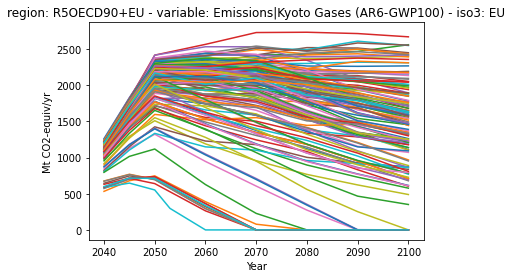

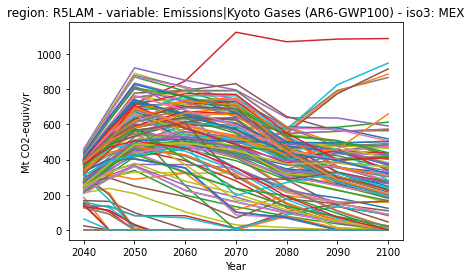

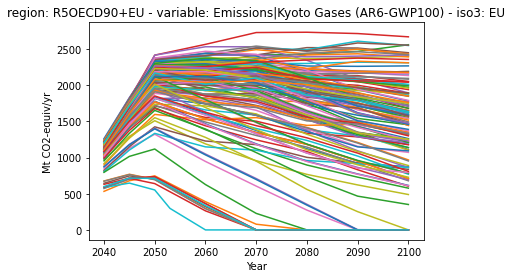

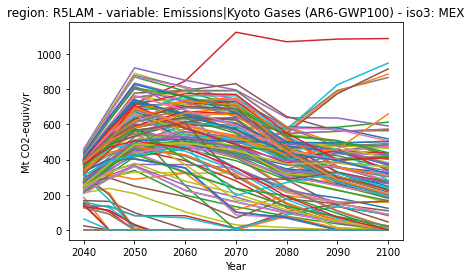

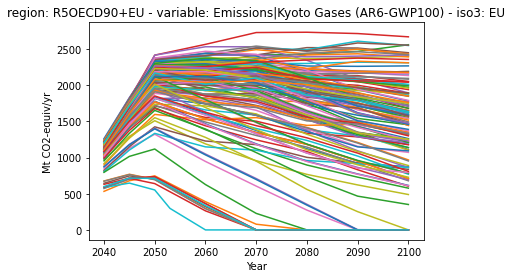

...

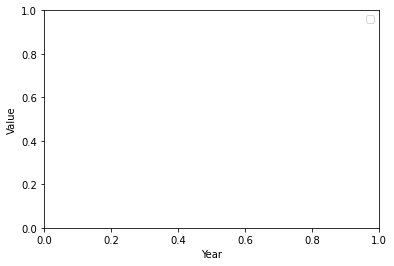

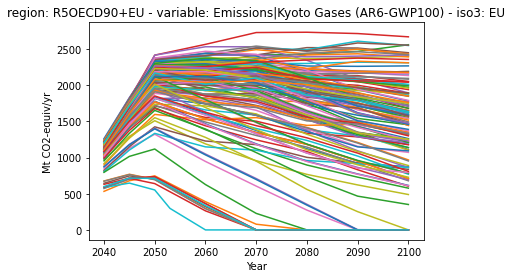

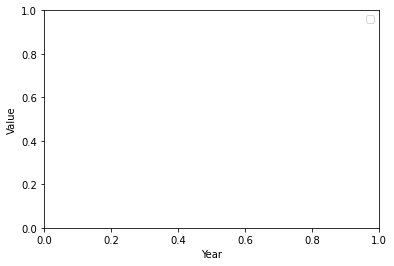

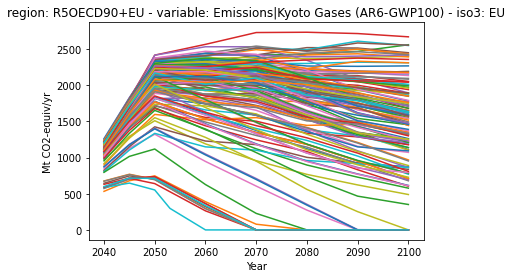

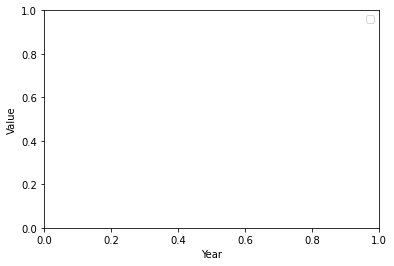

In [92]:
# We append the most recent relevant estimate of the fractional importance of the region using 
# the CAIT data
emissions_avoided_dict = {}
for confidence_col in confidence_cols:
    for certainty in ["all", "higher", "lower"]:
        print(f"certainty: {certainty}, conf: {confidence_col}")
        for co2_or_kyoto in ["all_GHG", "CO2_only"]:
            nzcoms = nzcoms_copy.copy()
            nzcoms["fraction2030"] = np.nan
            if certainty == "higher":
                nzcoms = nzcoms.loc[nzcoms[confidence_col] == "higher", :]
            if certainty == "lower":
                nzcoms = nzcoms.loc[[x in ["higher", "lower"] for x in nzcoms[confidence_col]], :]
            print(nzcoms["Country"].head())
            co2_or_kyoto_col = "Net zero target applicable to"
            for index, row in nzcoms.iterrows():
                frac0 = cait_data.loc[(cait_data["iso3"] == row["iso3"])]["region_fraction"]
                assert len(frac0) == 1
                frac0 = frac0.values[0]
                fraction2030 = frac0 * float(row[col2030]) / float(row[currentcol])
                # if the value applies to anything other than Kyoto total, find the fraction of the kyoto total 
                # that is CO2 in that region at that time. 
                if co2_or_kyoto == "CO2_only":
                    if row[co2_or_kyoto_col] in ["UNCLEAR", "CO2"]:
                        co2frac2030 = (nominated_scen.filter(variable=co2, region=row["region"]).data.value / 
                            nominated_scen_kyoto.filter(region=row["region"]).data.value).squeeze()
                        print(f'Country {row["iso3"]} is CO2 only, reduced by {co2frac2030}')
                        fraction2030 = co2frac2030 * fraction2030
                else:
                    if row[co2_or_kyoto_col] in ["CO2"]:
                        co2frac2030 = (nominated_scen.filter(variable=co2, region=row["region"]).data.value / 
                            nominated_scen_kyoto.filter(region=row["region"]).data.value).squeeze()
                        print(f'Country {row["iso3"]} is CO2 only, reduced by {co2frac2030}')
                        fraction2030 = co2frac2030 * fraction2030
                nzcoms.loc[index, "fraction2030"] = fraction2030
            # Add total Kyoto emissions in all the required years
            region_tot_kyoto = regions_kyoto.interpolate(time=interpyears)
            all_extensions_orig = all_extensions_orig.interpolate(interpyears)

            # Now we can calculate the avoided emissions
            # Remove existing variable if any to allow reruns
            try:
                del emissions_avoided
            except:
                pass
            for index, row in nzcoms.iterrows():
                em2030 = region_tot_kyoto.filter(year=2030, region=row["region"])
                emrecent = region_tot_kyoto.filter(year=int(currentcol), region=row["region"])
                assert em2030.data[["model", "scenario"]].equals(emrecent.data[["model", "scenario"]])
                frac2030 = row["fraction2030"] * (emrecent.data.value / em2030.data.value)
                # Years in between the nz commitment year and 2030 have the appropriate fraction 
                # reduced linearly towards zero. 
                for year in [
                    year for year in region_tot_kyoto.year if (year > 2030) & (year < int(row["Year.2"]))
                ]:
                    emissions_avoided_inst = region_tot_kyoto.filter(year=year, region=row["region"]).data
                    emissions_avoided_inst["iso3"] = row["iso3"]
                    # We only apply the reduction to emissions when the region is producing positive emissions!
                    emissions_avoided_inst["value"] = (emissions_avoided_inst["value"] * frac2030 - row["Total.2"])
                    emissions_avoided_inst["value"] = emissions_avoided_inst["value"] * (
                        emissions_avoided_inst["value"] > 0) * ((year - 2030) / (int(row["Year.2"]) - 2030)
                    )
                    try:
                        emissions_avoided = emissions_avoided.append(emissions_avoided_inst)
                    except NameError:
                        emissions_avoided = emissions_avoided_inst
                # Years after the nz year have the relevant fraction set to 0
                for year in [year for year in region_tot_kyoto.year if year >= int(row["Year.2"])]:
                    emissions_avoided_inst = region_tot_kyoto.filter(year=year, region=row["region"]).data
                    emissions_avoided_inst["iso3"] = row["iso3"]
                    emissions_avoided_inst["value"] = (emissions_avoided_inst["value"] * frac2030 - row["Total.2"])
                    emissions_avoided_inst["value"] = emissions_avoided_inst["value"] * (emissions_avoided_inst["value"] > 0)
                    emissions_avoided = emissions_avoided.append(emissions_avoided_inst)
            # Plot the emissions change for a few fiddly cases
            pyam.IamDataFrame(emissions_avoided[emissions_avoided["iso3"]=="EU"]).filter(scenario="*SSP2*").plot()
            pyam.IamDataFrame(emissions_avoided[emissions_avoided["iso3"]=="MEX"]).filter(scenario="*SSP2*").plot()
            major_columns = ["model", "scenario", "region", "variable", "unit", "year"]
            emissions_avoided = emissions_avoided.groupby(major_columns).sum().reset_index()
            emissions_avoided_world = pyam.IamDataFrame(emissions_avoided).aggregate_region(kyoto)
            assert len(emissions_avoided_world.filter(year=2080).data) == len(
                all_extensions_orig.filter(variable=kyoto, year=2080))
            emissions_avoided_dict[(confidence_col, certainty, co2_or_kyoto)] = emissions_avoided_world

In [93]:
all_extensions_orig.filter(variable=kyoto)

<class 'pyam.core.IamDataFrame'>
Index:
 * model    : Current policies, NDC case - conditional, NDC case - unconditional (3)
 * scenario : ... (80)
Timeseries data coordinates:
   region   : World (1)
   variable : Emissions|Kyoto Gases (AR6-GWP100) (1)
   unit     : Mt CO2-equiv/yr (1)
   year     : 2010, 2015, 2020, 2030, 2040, 2045, 2050, 2053, ... 2100 (13)
Meta indicators:
   exclude (bool) False (1)

In [94]:
# Apply net zero avoidance to the original pathways
try:
    del nzpathways
except:
    pass
for confidence_col in confidence_cols:
    for certainty in ["all", "higher", "lower"]:
        for co2_or_kyoto in ["CO2_only", "all_GHG"]:
            nzpathways_i = all_extensions_orig.filter(variable=kyoto).interpolate(interpyears).data
            nzpathways_i = nzpathways_i.merge(
                emissions_avoided_dict[(confidence_col, certainty, co2_or_kyoto)].data, on=major_columns, how="left"
            )
            nzpathways_i.value_y[np.isnan(nzpathways_i.value_y)] = 0

            nzpathways_i["value"] = nzpathways_i["value_x"] - nzpathways_i["value_y"]
            nzpathways_i = nzpathways_i.drop(["value_x", "value_y"], axis=1)
            nzpathways_i["scenario"] = (
                nzpathways_i["scenario"] + "|nz_" + co2_or_kyoto + "|cert_" + certainty + "conf_" + str(confidence_col)
            )
            try:
                nzpathways = nzpathways.append(pyam.IamDataFrame(nzpathways_i))
            except NameError:
                nzpathways = pyam.IamDataFrame(nzpathways_i)

C:\Users\rlamboll\Anaconda3\envs\silicone-1\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


In [95]:
nzpathways.scenario[:4]

['10th percentile|Harmonized|AIM/CGE 2.0_SSP2 kyoto extended|nz_CO2_only|cert_allconf_0.1',
 '10th percentile|Harmonized|AIM/CGE 2.0_SSP2 kyoto extended|nz_CO2_only|cert_higherconf_0.1',
 '10th percentile|Harmonized|AIM/CGE 2.0_SSP2 kyoto extended|nz_CO2_only|cert_lowerconf_0.1',
 '10th percentile|Harmonized|AIM/CGE 2.0_SSP2 kyoto extended|nz_all_GHG|cert_allconf_0.1']

pyam.core - WARNING: Filtered IamDataFrame is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!


<AxesSubplot:xlabel='Year', ylabel='Value'>

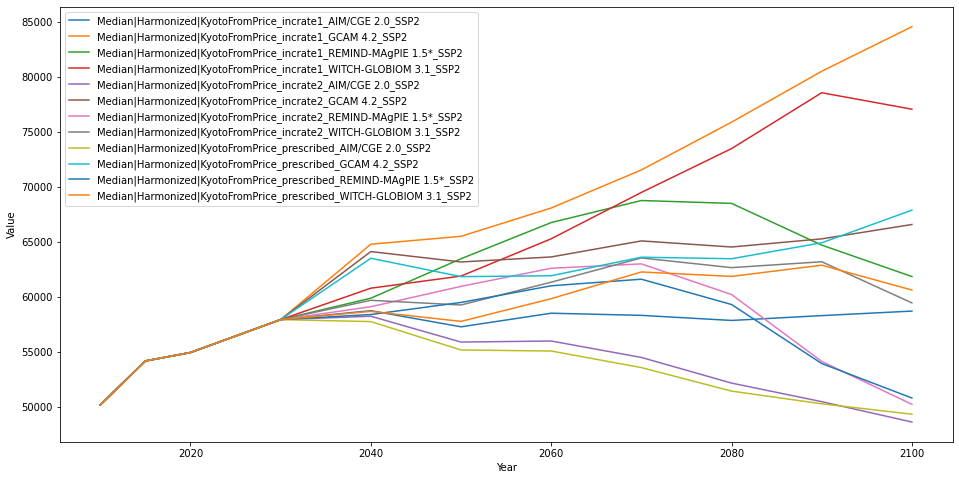

In [96]:
plt.figure(figsize=(16,8))
ax = plt.subplot(111)
all_extensions_orig.filter(model="Current policies", 
                           variable=kyoto, scenario="Median*Kyoto*SSP2*").plot(ax=ax)
plt.gca().set_prop_cycle(None)
nzpathways.filter(model="Current policies", 
                  variable=kyoto, scenario="Median*Kyoto*SSP2*CO2_only|certainty_all").plot(ax=ax, 
    linestyle="--")
plt.gca().set_prop_cycle(None)
nzpathways.filter(model="Current policies", 
                  variable=kyoto, scenario="Median*Kyoto*SSP2*GHG*|certainty_all").plot(ax=ax,
    linestyle=":")

pyam.core - WARNING: Filtered IamDataFrame is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!
pyam.core - WARNING: Filtered IamDataFrame is empty!


<AxesSubplot:xlabel='Year', ylabel='Value'>

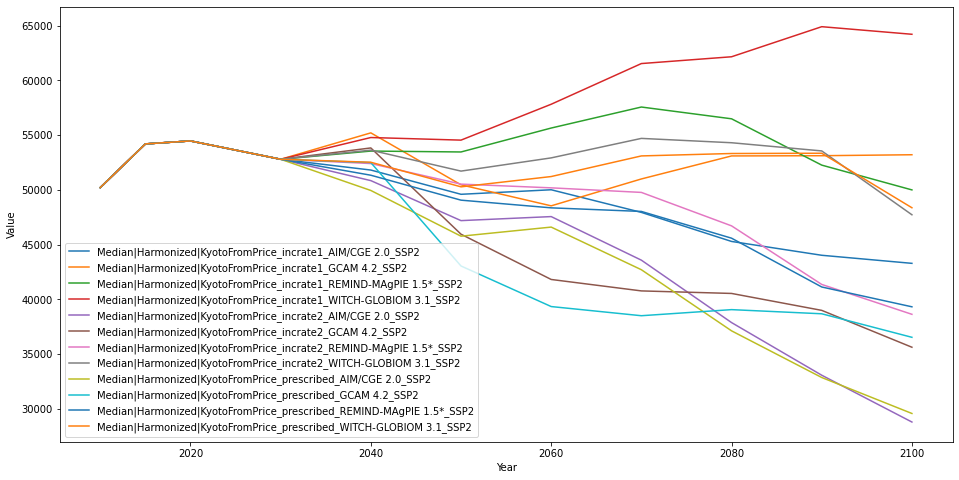

In [97]:
plt.figure(figsize=(16,8))
modelstr = "NDC case - conditional"
ax = plt.subplot(111)
all_extensions_orig.filter(model=modelstr, variable=kyoto, scenario="Median*Kyoto*SSP2*").plot(ax=ax)
plt.gca().set_prop_cycle(None)
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*SSP2*CO2_only*certainty_all").plot(ax=ax, 
    linestyle="--")
plt.gca().set_prop_cycle(None)
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*SSP2*CO2_only*certainty_higher").plot(ax=ax, 
    linestyle=":")
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*SSP2*CO2_only*certainty_lower").plot(ax=ax, 
    linestyle="-", linewidth=0.5)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: NDC case - conditional - region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

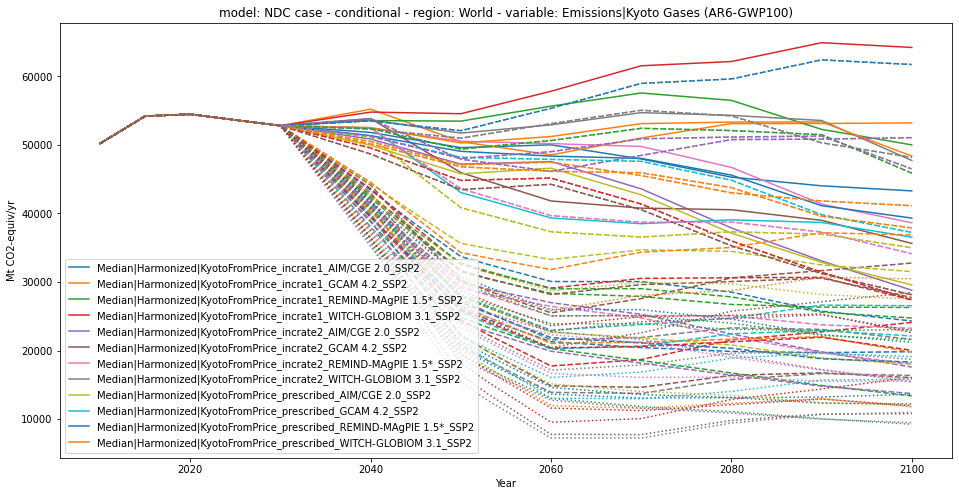

In [98]:
plt.figure(figsize=(16,8))
modelstr = "NDC case - conditional"
ax = plt.subplot(111)
all_extensions_orig.filter(model=modelstr, 
                           variable=kyoto, scenario="Median*Kyoto*SSP2*").plot(ax=ax)
plt.gca().set_prop_cycle(None)
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*SSP2*CO2_only*").plot(ax=ax, 
    linestyle="--")
plt.gca().set_prop_cycle(None)
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*SSP2*GHG*").plot(ax=ax,
    linestyle=":")

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: R5OECD90+EU - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

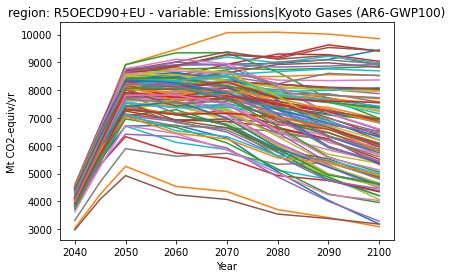

In [99]:
pyam.IamDataFrame(emissions_avoided).filter(region="R5OE*", scenario="*Kyoto*SSP2*").plot()

# Finally break down the nz-corrected Kyoto baskets into their components
We use only the appropriate scenario in the harmonised SR1.5 dataset to do this again. 

In [100]:
years = [2015] + list(range(2010, 2101, 10)) + interpyears
if co2afolu not in set(non_co2_ind_compon):
    non_co2_ind_compon = non_co2_ind_compon + [co2afolu]
harmed_sr15 = harmed_sr15.interpolate(interpyears)
all_nz_extensions = nzpathways.copy()
fgas_em_inf = mi.DecomposeCollectionTimeDepRatio(harmed_sr15.filter(year=years, region="World").interpolate(interpyears))
for (model, scenario) in mod_scen_list:
    print ("Running model {}, scenario {}".format(model, scenario))
    extend_df = nzpathways.filter(scenario="*" + model + "*" + scenario)
    infill_df = harmed_sr15.filter(model=model, scenario=scenario)
    # Perform the infilling using Kyoto total (no exclusions)
    infill_results = infill_components_of_partial_aggregate(
        variable, extend_df, infill_df, non_co2_ind_compon, co2, co2ind, co2afolu, 
        fgas_em_inf, years, fgas, fgases, hfcs
    )
    
    all_nz_extensions = all_nz_extensions.append(infill_results.filter(variable=variable, keep=False), ignore_meta_conflict=True)

Running model WITCH-GLOBIOM 3.1, scenario SSP2*


c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125', 'Emissions|SF6'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables: 100%|██████████████████████████████████████████████████████| 11/11 [00:03<00:00,  3.25it/s]


Running model AIM/CGE 2.0, scenario SSP2*


c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125', 'Emissions|SF6'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables: 100%|██████████████████████████████████████████████████████| 11/11 [00:03<00:00,  3.32it/s]


Running model REMIND-MAgPIE 1.5*, scenario SSP2*


c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125', 'Emissions|SF6'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables:  42%|██████████████████████▉                                | 5/12 [00:00<00:00,  7.43it/s]

Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


Filling required variables: 100%|██████████████████████████████████████████████████████| 12/12 [00:01<00:00,  6.93it/s]

Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.



Filling required variables: 100%|██████████████████████████████████████████████████████| 11/11 [00:03<00:00,  2.95it/s]


Running model GCAM 4.2, scenario SSP2*


c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125', 'Emissions|SF6'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables:  33%|██████████████████▎                                    | 4/12 [00:00<00:01,  5.09it/s]

Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


Filling required variables: 100%|██████████████████████████████████████████████████████| 12/12 [00:01<00:00,  7.05it/s]


Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


Filling required variables: 100%|██████████████████████████████████████████████████████| 11/11 [00:03<00:00,  2.93it/s]


In [101]:
all_nz_extensions = all_nz_extensions.data
for var in vars_to_convert:
    ind = [var in y for y in all_nz_extensions["variable"]]
    assert (all_nz_extensions.iloc[ind].value==0).all()
    index = all_nz_extensions[ind].index
    all_nz_extensions.loc[index, "unit"] = all_nz_extensions.loc[index, "unit"].str.replace("Mt CO2-equiv", "kt " + var)
all_nz_extensions = pyam.IamDataFrame(all_nz_extensions)

In [102]:
assert all_nz_extensions.filter(variable="*C6F14").unit == ["kt C6F14/yr"]
assert all_extensions_orig.filter(variable="*C6F14").unit == ["kt C6F14/yr"]

In [103]:
# Check that we don't miss out some important variables from this scenario
assert len(
    [var for var in all_extensions.variable if var not in 
 all_extensions.filter(scenario=all_extensions.scenario[0]).variable + 
     ['Emissions|F-Gases', 'Price|Carbon']
    ]
) == 0

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|SF6'}, xlabel='Year', ylabel='kt SF6/yr'>

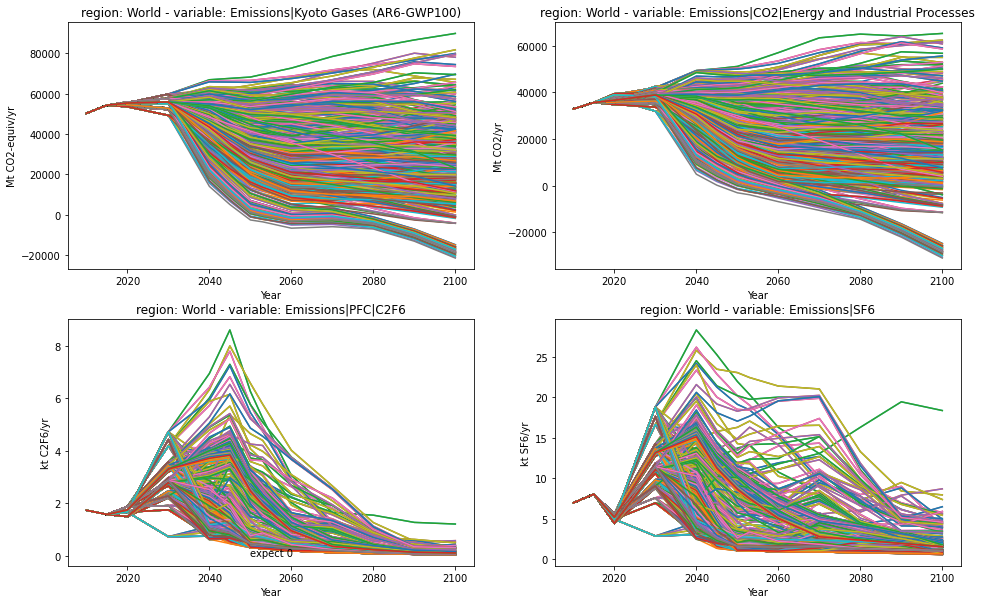

In [104]:
plt.figure(figsize=(16, 10))
ax = plt.subplot(2, 2, 1)
all_nz_extensions.filter(variable=kyoto).plot(ax=ax)
ax= plt.subplot(2, 2, 2)
all_nz_extensions.filter(variable=co2ind).plot(ax=ax)
ax= plt.subplot(2, 2, 3)
all_nz_extensions.filter(variable="Emissions|PFC|C2F6").plot(ax=ax)
plt.text(x=2050, y=0, s="expect 0")
ax= plt.subplot(2, 2, 4)
all_nz_extensions.filter(variable="*SF6").plot(ax=ax)

In [105]:
assert len(all_nz_extensions.filter(variable="Emissions|PFC|C2F6").timeseries())==len(
    all_nz_extensions.filter(variable=co2afolu).timeseries())

In [106]:
ts = all_nz_extensions.filter(variable=kyoto).timeseries()
ts.loc[ts[2050] == max(ts[2050]), :]

2010  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  50209.503493   
                 Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  50209.503493   

                                                                                                                                       2015  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54198.069883   
                 Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  54198.069883   

                                                                                                                                       2020  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55405.021054   
                 Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55405.021054   

                                                                                                                                       2030  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  59722.144146   
                 Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  59722.144146   

                                                                                                                                       2040  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  66824.279833   
                 Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  66824.279833   

                                                                                                                                       2045  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  67491.952523   
                 Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  67491.952523   

                                                                                                                                       2050  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  68156.564478   
                 Max|Harmonized|KyotoFromPrice_incrate1_GCAM 4.2... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  68156.564478   

                                                                                                                            

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|SF6'}, xlabel='Year', ylabel='kt SF6/yr'>

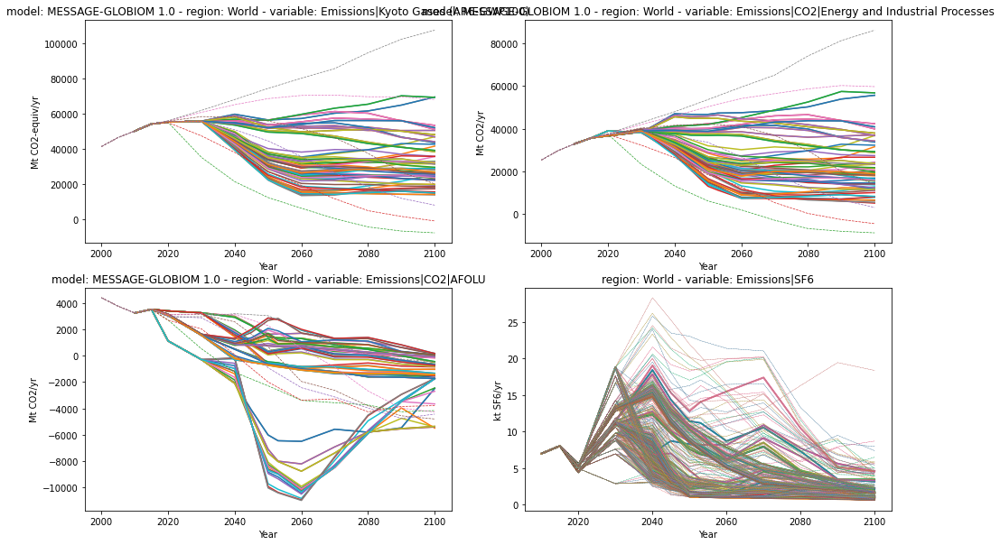

In [107]:
# Note that the SF6 data does not come from any specific scenario
plt.figure(figsize=(16, 10))
scen_str = "Median|Harmonized|KyotoFromPrice_*"
model_str = "NDC case - unconditional"
ax = plt.subplot(2, 2, 1)
all_nz_extensions.filter(variable=kyoto, scenario=scen_str, model=model_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=kyoto, model="*MESSAGE-GLOBIOM*", scenario="SSP2*").plot(
    ax=ax, linewidth=0.7, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 2)
all_nz_extensions.filter(variable=co2ind, scenario=scen_str, model=model_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=co2ind, model="*MESSAGE-GLOBIOM*", scenario="SSP2*").plot(
    ax=ax, linewidth=0.7, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 3)
all_nz_extensions.filter(variable=co2afolu, scenario=scen_str, model=model_str).plot(ax=ax, linewidth=1.5)
harmed_sr15.filter(variable=co2afolu, model="*MESSAGE-GLOBIOM*", scenario="SSP2*").plot(
    ax=ax, linewidth=0.7, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 4)
all_nz_extensions.filter(variable="*SF6", scenario=scen_str, model=model_str).plot(ax=ax, linewidth=1.7, legend=False)
all_nz_extensions.filter(variable="*SF6").plot(ax=ax, linewidth=0.3, linestyle="--", legend=False)

<AxesSubplot:title={'center':'region: World - variable: Emissions|SF6'}, xlabel='Year', ylabel='kt SF6/yr'>

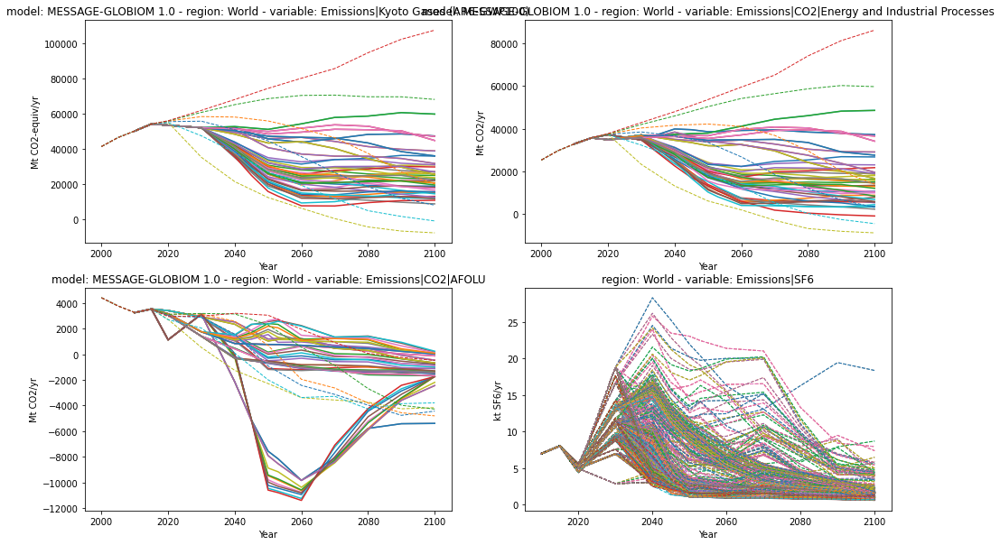

In [108]:
# Note that the SF6 data does not come from any specific scenario
plt.figure(figsize=(16, 10))
ax = plt.subplot(2, 2, 1)
scen_str = "Min|Harmonized|KyotoFromPrice_incr*"
all_nz_extensions.filter(variable=kyoto, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=kyoto, model="*MESSAGE-GLOBIOM*", scenario="SSP2*").plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 2)
all_nz_extensions.filter(variable=co2ind, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=co2ind, model="*MESSAGE-GLOBIOM*", scenario="SSP2*").plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 3)
all_nz_extensions.filter(variable=co2afolu, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=co2afolu, model="*MESSAGE-GLOBIOM*", scenario="SSP2*").plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 4)
all_nz_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_nz_extensions.filter(variable="*SF6").plot(ax=ax, linewidth=1, linestyle="--", legend=False)

<AxesSubplot:title={'center':'model: Current policies - region: World - variable: Emissions|BC'}, xlabel='Year', ylabel='Mt BC/yr'>

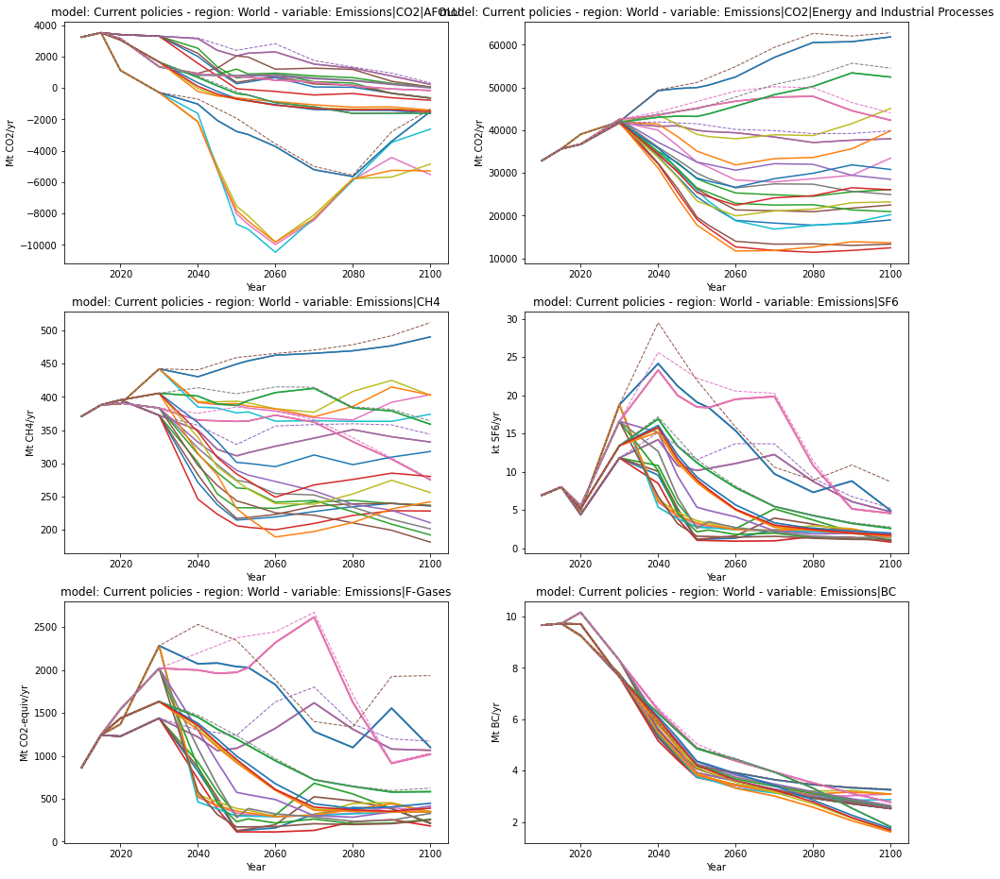

In [109]:
plt.figure(figsize=(16, 16))
ax = plt.subplot(3, 2, 1)
scen_str = "Max|Harmonized|KyotoFromPrice_prescribed*"
all_nz_extensions.filter(variable=co2afolu, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable=co2afolu, scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 2)
all_nz_extensions.filter(variable=co2ind, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable=co2ind, scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 3)
all_nz_extensions.filter(variable="*CH4", scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable="*CH4", scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 4)
all_nz_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 5)
all_nz_extensions.filter(variable="*F-Gases", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*F-Gases", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 6)
all_nz_extensions.filter(variable="*BC", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*BC", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)

<AxesSubplot:title={'center':'model: Current policies - region: World - variable: Emissions|BC'}, xlabel='Year', ylabel='Mt BC/yr'>

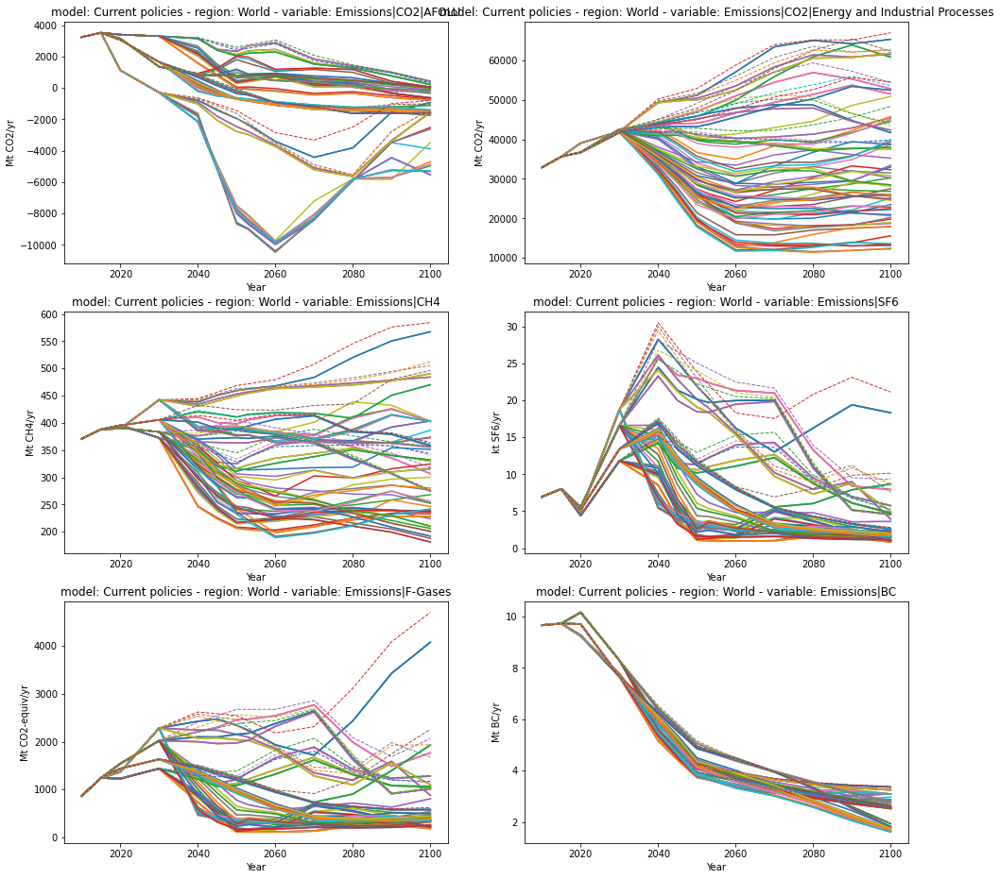

In [110]:
plt.figure(figsize=(16, 16))
ax = plt.subplot(3, 2, 1)
scen_str = "Max|Harmonized|KyotoFromPrice*"
all_nz_extensions.filter(variable=co2afolu, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable=co2afolu, scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 2)
all_nz_extensions.filter(variable=co2ind, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable=co2ind, scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 3)
all_nz_extensions.filter(variable="*CH4", scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable="*CH4", scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 4)
all_nz_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 5)
all_nz_extensions.filter(variable="*F-Gases", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*F-Gases", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 6)
all_nz_extensions.filter(variable="*BC", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*BC", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)

In [111]:
all_scenarios = all_extensions.append(all_nz_extensions)
all_scenarios = all_scenarios.interpolate(all_scenarios.year)
all_scenarios.to_csv("../output/infilled_extended_and_infilled_unep_{}.csv".format(version_no))

In [112]:
other_kyoto = all_scenarios.filter(variable=[variable, co2, co2afolu, co2ind]).append(
    _construct_consistent_values(
    "Emissions|Kyoto Gases (AR5-GWP100)", kyoto_emissions, convert_units_to_MtCO2_equiv(
        all_scenarios.filter(variable=kyoto_emissions), metric_name="AR5GWP100"
    )
)).append(
    _construct_consistent_values(
    "Emissions|Kyoto Gases (AR4-GWP100)", kyoto_emissions, convert_units_to_MtCO2_equiv(
        all_scenarios.filter(variable=kyoto_emissions), metric_name="AR4GWP100"
    )
)
)
other_kyoto.variable

['Emissions|CO2',
 'Emissions|CO2|AFOLU',
 'Emissions|CO2|Energy and Industrial Processes',
 'Emissions|Kyoto Gases (AR4-GWP100)',
 'Emissions|Kyoto Gases (AR5-GWP100)',
 'Emissions|Kyoto Gases (AR6-GWP100)']

In [113]:
assert len(other_kyoto.filter(variable=co2).scenario) == len(other_kyoto.filter(variable=variable).scenario)
assert len(other_kyoto.filter(variable=co2).scenario) == len(other_kyoto.filter(variable="Emissions|Kyoto Gases (AR5-GWP100)").scenario)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

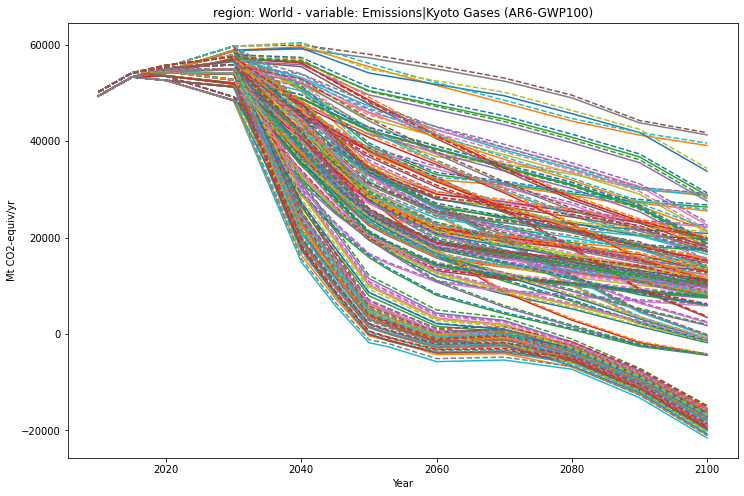

In [114]:
plt.figure(figsize=(12, 8))
ax=plt.subplot()
other_kyoto.filter(variable="*AR4-GWP100*", scenario="*extended|nz_CO2_only|*").plot(ax=ax)
other_kyoto.filter(variable="*AR6-GWP100*", scenario="*extended|nz_CO2_only|*").plot(ax=ax, linestyle="--")

In [115]:
other_kyoto.to_csv("../output/kyoto_and_co2_emissions_summary_{}.csv".format(version_no))

# Export .scen files

In [116]:
def construct_scen_file(infilled_data, scen_file_name):
    """Function to construct scen file"""
    def rename_variables(v):
        """Format variables to MAGICC variable convention"""
        mapping = {
        'Emissions|HFC|HFC143a':'Emissions|HFC143a',
        'Emissions|HFC|HFC245ca':"Emissions|HFC245fa",
        'Emissions|CO2|AFOLU':'Emissions|CO2|MAGICC AFOLU',
        'Emissions|HFC|HFC43-10': 'Emissions|HFC4310',
        'Emissions|HFC|HFC32':'Emissions|HFC32',
        'Emissions|HFC|HFC125':'Emissions|HFC125',
        'Emissions|HFC|HFC227ea':'Emissions|HFC227ea',
        'Emissions|CO2|Energy and Industrial Processes': 'Emissions|CO2|MAGICC Fossil and Industrial',
        'Emissions|HFC|HFC134a':'Emissions|HFC134a',
        'Emissions|HFC|HFC23':'Emissions|HFC23',
        'Emissions|PFC|CF4': 'Emissions|CF4',
        'Emissions|PFC|C2F6': 'Emissions|C2F6',
        'Emissions|PFC|C6F14': 'Emissions|C6F14',
        'Emissions|Sulfur': 'Emissions|SOx',
        'Emissions|VOC':'Emissions|NMVOC'
        }
    
        try:
            return mapping[v]
        except KeyError:
            return v

    def replace_units(u):
        """Replace units for NOx"""
            
        mapping = {
            'Mt NOX/yr': 'Mt NO2 / yr',
        }
        try:
            return mapping[u]
        except KeyError:
            return u

    # Filter out HFC and non HFC - unit conversions
    non_hfc = infilled_data.filter(variable=["Emissions|HFC*", "Emissions|PFC*"], keep=False)
    hfc = infilled_data.filter(variable=["Emissions|HFC*", "Emissions|PFC*"]).data
    
    # Work around for HFC345ca
    hfc["unit"] = hfc["variable"].apply(
        lambda x: 
        "kt {} / yr".format(
            x
            .split("|")[-1]
            .replace("-", "")
            .replace("245ca", "245fa")
        )
    )
    hfc = pyam.IamDataFrame(hfc)
    enCO2 = non_hfc.filter(variable="Emissions|CO2|Energy and Industrial Processes").data
    enCO2["unit"] = "Mt CO2/yr"
    enCO2 = pyam.IamDataFrame(enCO2)
    non_hfc = non_hfc.filter(
        variable = "Emissions|CO2|Energy and Industrial Processes",
        keep = False
    ).append(enCO2)
    non_hfc = non_hfc.convert_unit("Mt NH3/yr", to="Mt N/yr", factor=14/17)

    # Create an SCM dataframe 
    scen_scm = scmdata.ScmRun(hfc.append(non_hfc))
    writer = pymagicc.io.MAGICCData(scen_scm)
    vars_not_used = [
        "Emissions|CO2", 
        "Emissions|F-Gases",
        'Emissions|kyotoghg_excl_lulucf'    
    ]
    writer = writer.filter(variable=vars_not_used, keep=False)
    # Check whether all the variables are named appropriately
    expected_names = [
        pymagicc.definitions.convert_magicc7_to_openscm_variables(f"{v}_EMIS") 
        for v in pymagicc.definitions.PART_OF_SCENFILE_WITH_EMISSIONS_CODE_1
    ]

    writer["variable"] = writer["variable"].apply(rename_variables)
    writer["unit"] = writer["unit"].apply(replace_units)
    writer["todo"] = "SET"
        
    missing_names = set(expected_names) - set(writer["variable"].unique())
    assert not missing_names, missing_names
    problematic_names = set(writer["variable"].unique()) - set(expected_names)
    assert not problematic_names, problematic_names

    # Unit conversion and cleaning 
    unit_specs = pymagicc.definitions.MAGICC7_EMISSIONS_UNITS.set_index("magicc_variable")
    for v in writer["variable"]:
            magicc_var = pymagicc.definitions.convert_magicc7_to_openscm_variables(
                v, inverse=True).replace("T_EMIS", "").replace("_EMIS", "")
            magicc_unit = unit_specs.loc[magicc_var, "emissions_unit"]
            writer = writer.convert_unit(magicc_unit, variable=v)
    
    # Now we add the 2000 data from the SR1.5 SCEN files to ensure MAGICC doesn't
    # assume constant emissions between 2000 and the start of the SCEN file
    base_scen_file = os.path.join(
        os.path.dirname(os.path.abspath("__file__")),
        "..",
        "Input",
        "IPCCSR15_REMIND-MAgPIE 1.7-3.0_PEP_2C_red_netzero_GAS.SCEN",
    )
    extra_hist = pymagicc.io.MAGICCData(base_scen_file).filter(
        year = range(1, writer["year"].min()),
        region = "World"
    )

    # Overwrite model, scenario names
    extra_hist["scenario"] = writer.get_unique_meta("scenario",True)
    extra_hist["model"] = writer.get_unique_meta("model", True)
    extra_hist["unit"] = extra_hist["unit"].apply(
        lambda x: (
            x
            .replace("134a", "134A")
            .replace("143a", "143A")
            .replace("245fa", "245FA")
            .replace("227ea", "227EA")
        )
    )

    writer = pymagicc.io.MAGICCData(pd.concat(
        [
            extra_hist.timeseries(time_axis="year", meta=writer.timeseries().index.names),
            writer.timeseries(time_axis="year"),
        ],
        axis=1,
    ))
    # Write the scen file
    writer.write("{}.SCEN".format(scen_file_name), magicc_version=6)

In [117]:
scen_folder = f"../output/scens/v{version_no}/"
if not os.path.exists(scen_folder):
    os.makedirs(scen_folder)
scen_file = (scen_folder + "{}")

In [118]:
all_scenarios_renamed = all_scenarios.copy().data
all_scenarios_renamed["scenario"] = all_scenarios_renamed["scenario"].str.replace("|", "_")
all_scenarios_renamed = pyam.IamDataFrame(all_scenarios_renamed)

C:\Users\rlamboll\Anaconda3\envs\silicone-1\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  


In [119]:
len(all_scenarios_renamed.data.loc[:, ["model", "scenario"]].drop_duplicates())

1008

In [120]:
for ind, (model, scenario) in all_scenarios_renamed.data.loc[:, ["model", "scenario"]].drop_duplicates().iterrows():
    construct_scen_file(all_scenarios_renamed.filter(scenario=scenario, model=model).filter(
        variable=['Emissions|Kyoto Gases (AR6-GWP100)', 
           'Emissions|HFC', 
           'Emissions|Kyoto Gases (AR6-GWP100)|Excluding CO2 AFOLU', 
           'Emissions|PFC', "Price|Carbon"
          ], keep=False), scen_file.format(
        model.replace(".", "-").replace(" ", "_") + "_-_" + scenario.replace(".", "-").replace(" ", "_").replace("/", "_").replace("*", "_")
        ))